In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import matplotlib.patches as patches

from scipy.stats import pearsonr, spearmanr
from scipy.stats import linregress

# CLR implementation

In [2]:
def clr_(data, eps=1e-6):
    """
    Perform centered log-ratio (clr) normalization on a dataset.

    Parameters:
    data (pandas.DataFrame): A DataFrame with samples as rows and components as columns.

    Returns:
    pandas.DataFrame: A clr-normalized DataFrame.
    """
    if (data < 0).any().any():
        raise ValueError("Data should be strictly positive for clr normalization.")

    # Add small amount to cells with a value of 0
    if (data <= 0).any().any():
        data = data.replace(0, eps)

    # Calculate the geometric mean of each row
    gm = np.exp(data.apply(np.log).mean(axis=1))

    # Perform clr transformation
    clr_data = data.apply(np.log).subtract(np.log(gm), axis=0)

    return clr_data

# Define output directory

In [4]:
out_dir = '../out_fingerprint/'

# Upload data metadata

In [3]:
md = pd.read_csv('../matrices/metadata.tsv', sep='\t', index_col=[0])
md.head()

,PANGAEA sample id,Station.label,Layer,Layer2,polar,lower.size.fraction,upper.size.fraction,Event.date,Latitude,Longitude,...,Gradient.Surface.temp(SST),Fluorescence,Density,Depth.Min.O2,Depth.Max.O2,Mean Flux at 150m,FluxAttenuation,NPP 8d VGPM (mgC/m2/day),Ocean,Province
TSC_NAME,,,,,,,,,,,,,,,,,,,,,
TSC000,TARA_X000000368,TARA_004,DCM,EPI,non polar,0.22,1.6,2009-09-15 18:00,36.5533,-6.5669,...,0.85990,NaN,26.886600,NaN,NaN,NaN,NaN,NaN,[NAO] North Atlantic Ocean (MRGID:1912),NaN
TSC001,TARA_Y200000002,TARA_004,SRF,EPI,non polar,0.22,1.6,2009-09-15 11:30,36.5533,-6.5669,...,0.73994,NaN,25.909909,NaN,NaN,NaN,NaN,686.0860,[NAO] North Atlantic Ocean (MRGID:1912),B7
TSC002,TARA_A200000159,TARA_007,DCM,EPI,non polar,0.22,1.6,2009-09-23 16:08,37.0541,1.9478,...,1.03750,NaN,27.003675,NaN,NaN,NaN,NaN,354.2245,[MS] Mediterranean Sea (MRGID:1905),NaN
TSC003,TARA_A200000113,TARA_007,SRF,EPI,non polar,0.22,1.6,2009-09-23 12:50,37.0510,1.9378,...,1.03750,NaN,25.611150,NaN,NaN,NaN,NaN,354.2245,[MS] Mediterranean Sea (MRGID:1905),B7
TSC004,TARA_X000001036,TARA_009,DCM,EPI,non polar,0.22,1.6,2009-09-28 16:59,39.0609,5.9422,...,0.35542,NaN,27.816050,NaN,NaN,NaN,NaN,205.1220,[MS] Mediterranean Sea (MRGID:1905),NaN


# Tara global 173 samples (all samples)

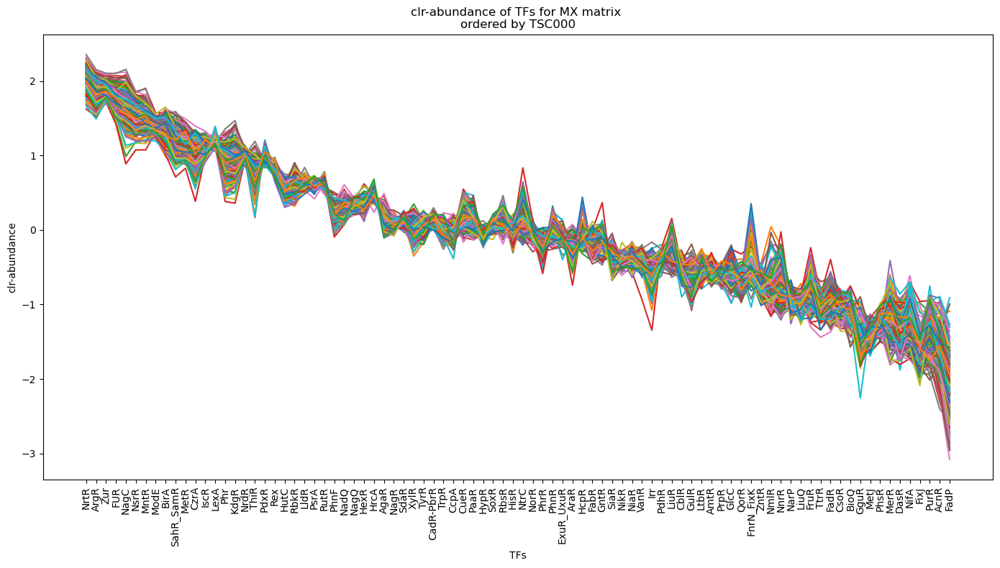

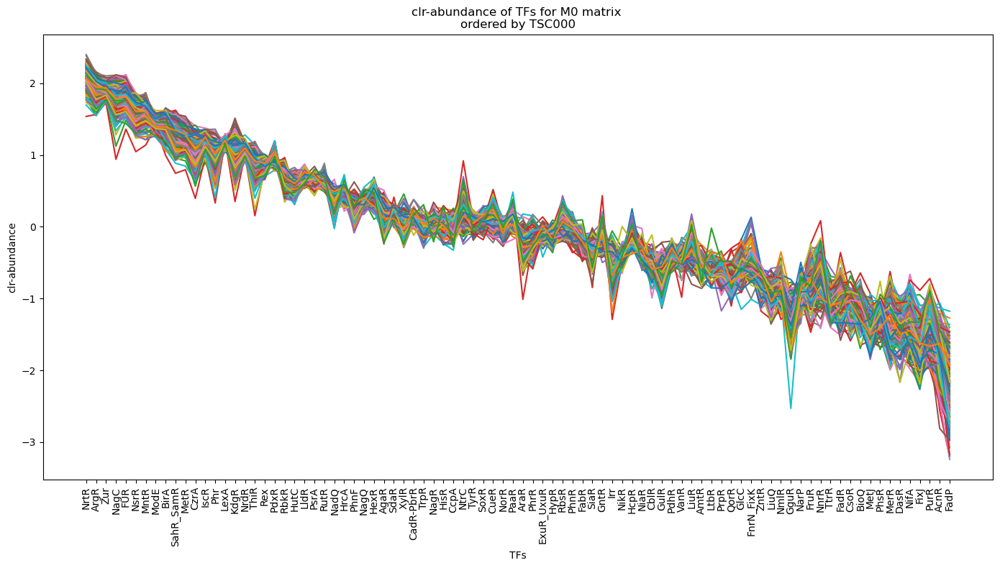

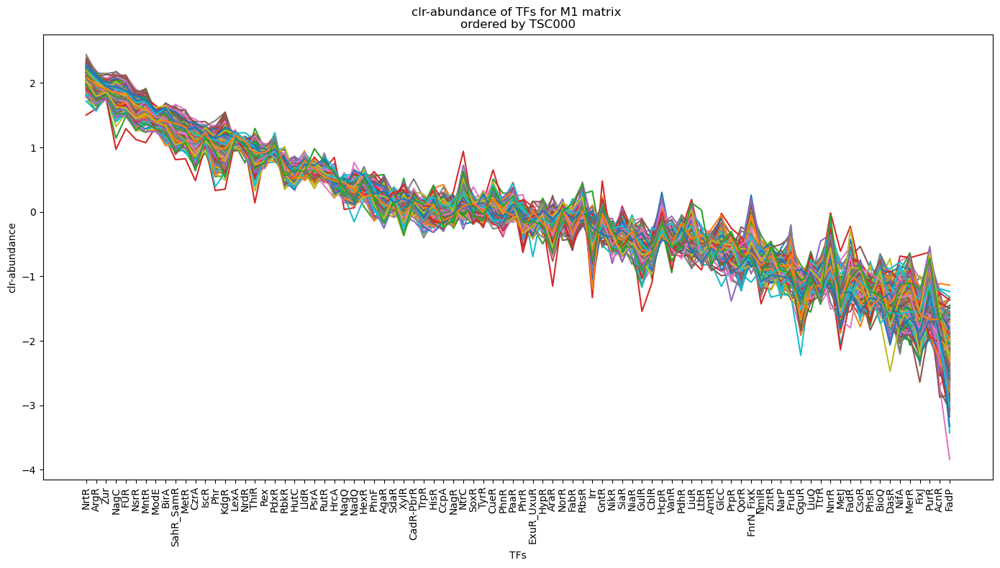

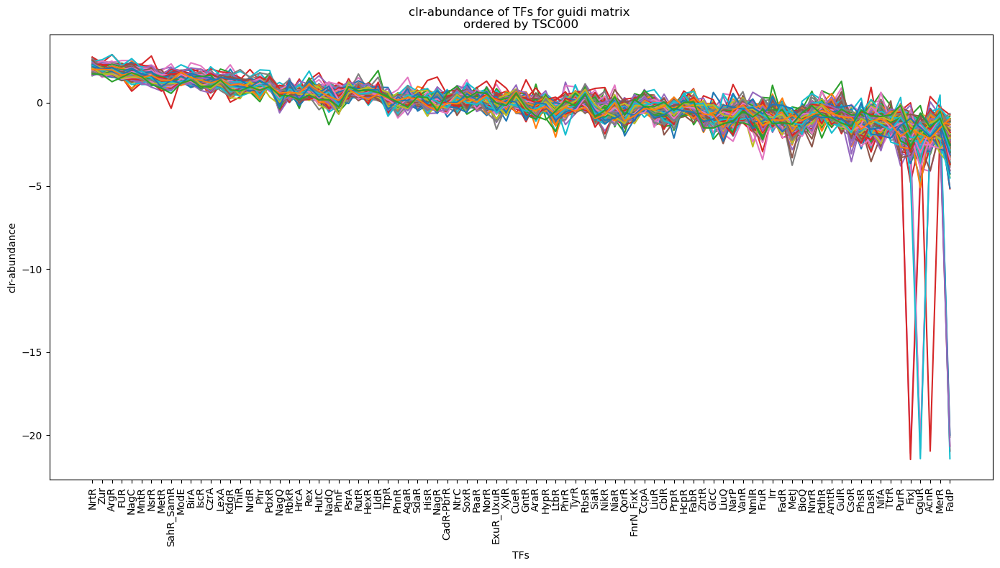

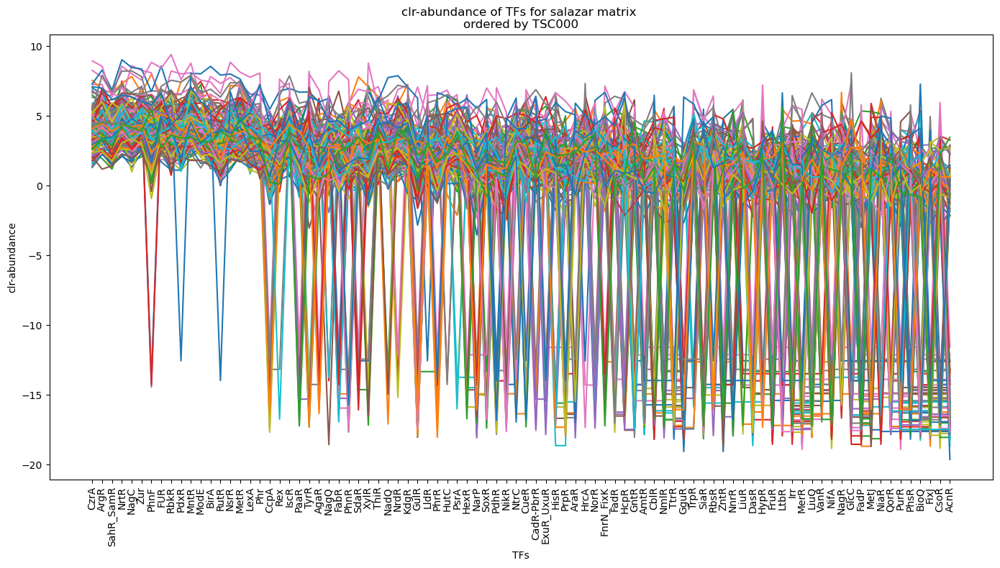

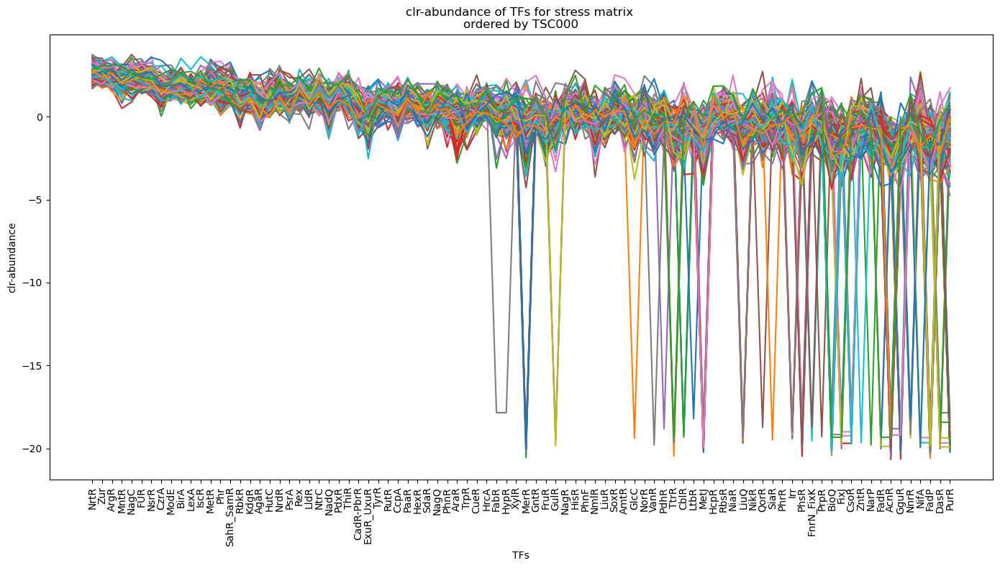

In [5]:
def plot_matrix_abundance(matrix_type, sample_name):
    
    matrix_file = f'../matrices/Matrix_{matrix_type}_all.tsv'
    df = pd.read_csv(matrix_file, sep='\t', index_col=0)
    clr_df = clr_(df) # centered-log-ratio normalization

    # Check if the sample is in the dataframe
    if sample_name not in clr_df.index:
        raise ValueError(f"The sample '{sample_name}' is not in the DataFrame.")

    clr_df_sorted = clr_df.loc[:, clr_df.loc[sample_name].sort_values(ascending=False).index]
    clr_df_transposed = clr_df_sorted.T

    plt.figure(figsize=(14, 8))
    for sample in clr_df_transposed.columns:
        plt.plot(clr_df_transposed.index, clr_df_transposed[sample])

    plt.title(f'clr-abundance of TFs for {matrix_type} matrix \nordered by {sample_name}')
    plt.xlabel('TFs')
    plt.ylabel('clr-abundance')
    plt.xticks(rotation=90, ha='center')

    output_file = f'fingerprint_tara_173_{matrix_type}.pdf'
    plt.tight_layout()
    plt.savefig(out_dir+output_file, bbox_inches='tight')
    plt.show()

matrix_types = ['MX', 'M0', 'M1', 'guidi', 'salazar', 'stress']
sample_name = 'TSC000' # Name of the sample to order

for matrix_type in matrix_types:
    plot_matrix_abundance(matrix_type, sample_name)

# Tara global 10 surface samples selected

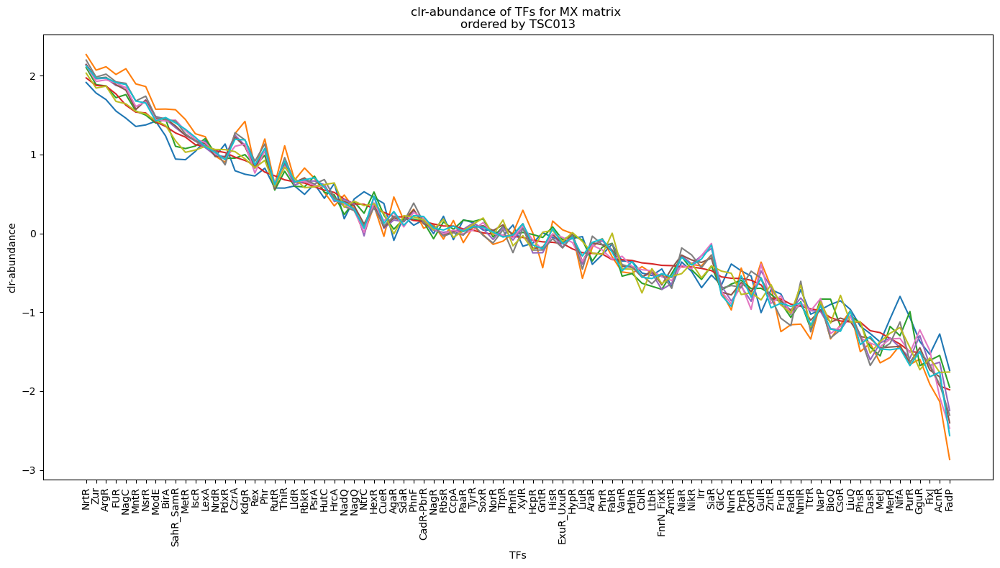

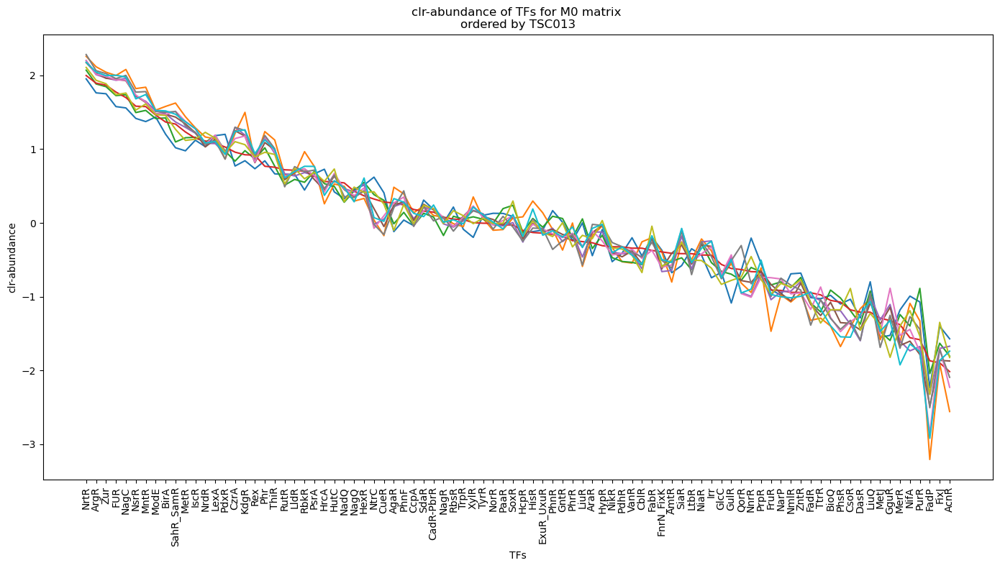

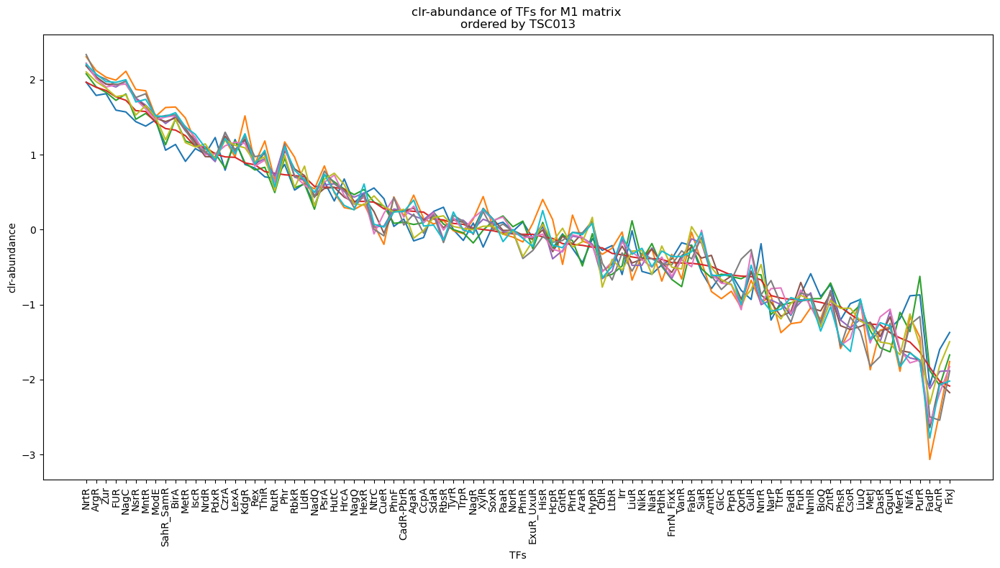

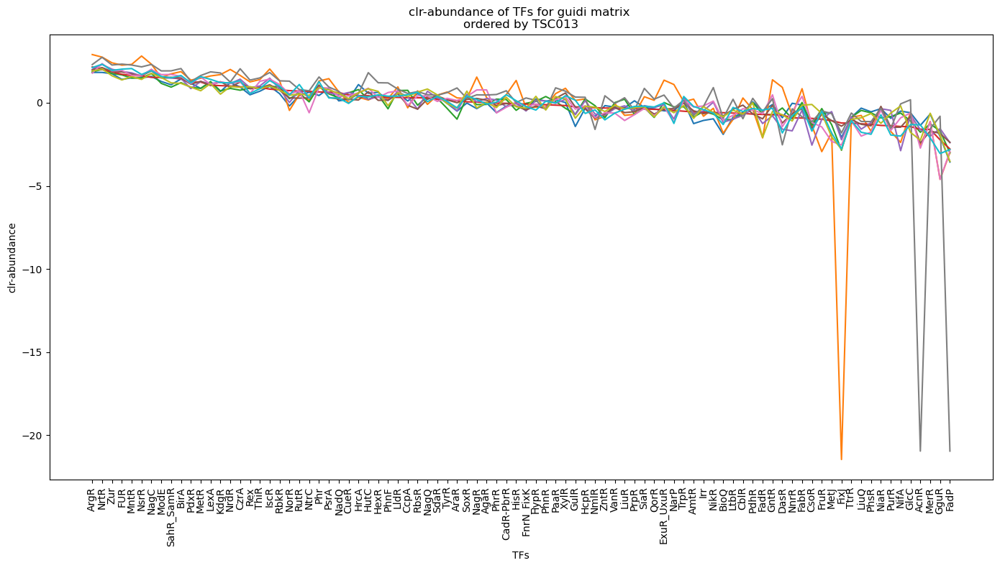

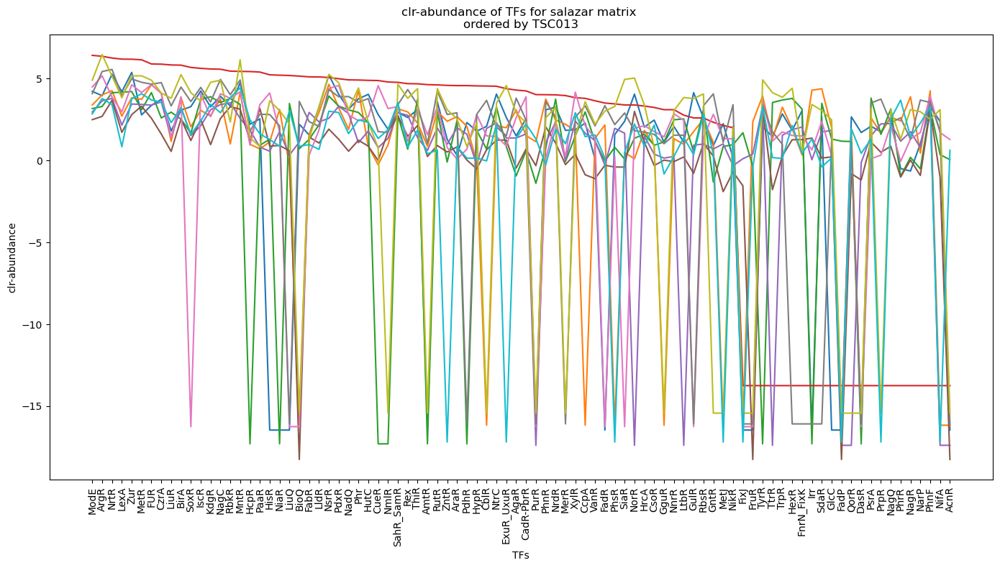

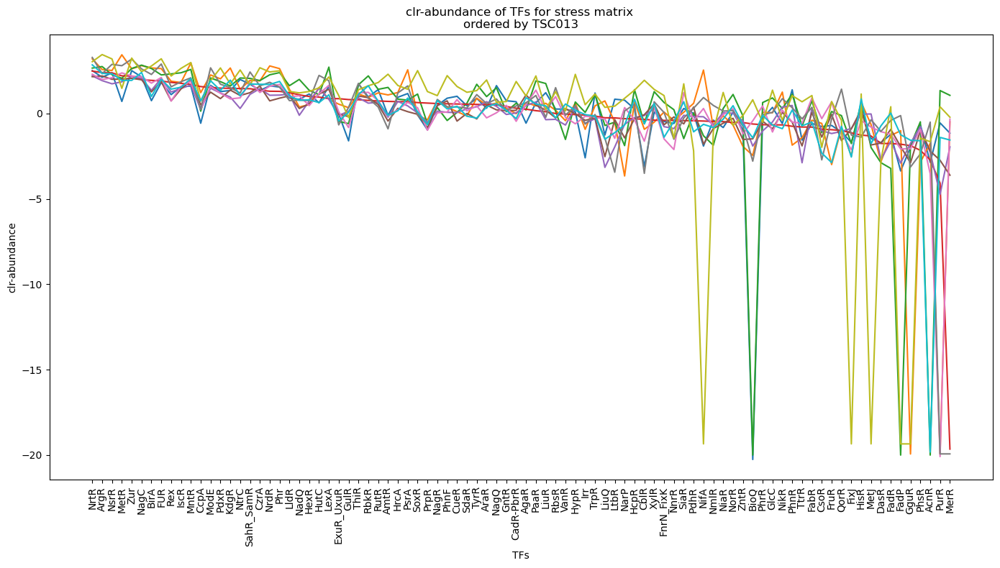

In [5]:
def plot_matrix_abundance_selected(matrix_type, sample_name, selected_indices):
    
    matrix_file = f'matrices2/Matrix_{matrix_type}_srf.tsv'
    df = pd.read_csv(matrix_file, sep='\t', index_col=0)
    clr_df = clr_(df)  # centered-log-ratio normalization

    if sample_name not in clr_df.index:
        raise ValueError(f"The sample '{sample_name}' is not in the DataFrame.")

    clr_df_sorted = clr_df.loc[:, clr_df.loc[sample_name].sort_values(ascending=False).index]
    clr_df_transposed = clr_df_sorted.T

    clr_df_transposed_filtered = clr_df_transposed[selected_indices]

    plt.figure(figsize=(14, 8))
    for sample in clr_df_transposed_filtered.columns:
        plt.plot(clr_df_transposed_filtered.index, clr_df_transposed_filtered[sample])

    plt.title(f'clr-abundance of TFs for {matrix_type} matrix \nordered by {sample_name}')
    plt.xlabel('TFs')
    plt.ylabel('clr-abundance')
    plt.xticks(rotation=90, ha='center')

    output_file = f'fingerprint_tara_10_selected_{matrix_type}.pdf'
    plt.tight_layout()
    plt.savefig(out_dir+output_file, bbox_inches='tight')
    plt.show()

matrix_types = ['MX', 'M0', 'M1', 'guidi', 'salazar', 'stress']
sample_name = 'TSC013' # Name of the sample to order

# Selected samples
selected_indices = ['TSC272', 'TSC065', 'TSC254', 'TSC013', 'TSC242', 'TSC216', 'TSC027', 'TSC135', 'TSC141', 'TSC167']

for matrix_type in matrix_types:
    plot_matrix_abundance_selected(matrix_type, sample_name, selected_indices)


## Tara global average of 10 surface samples selected

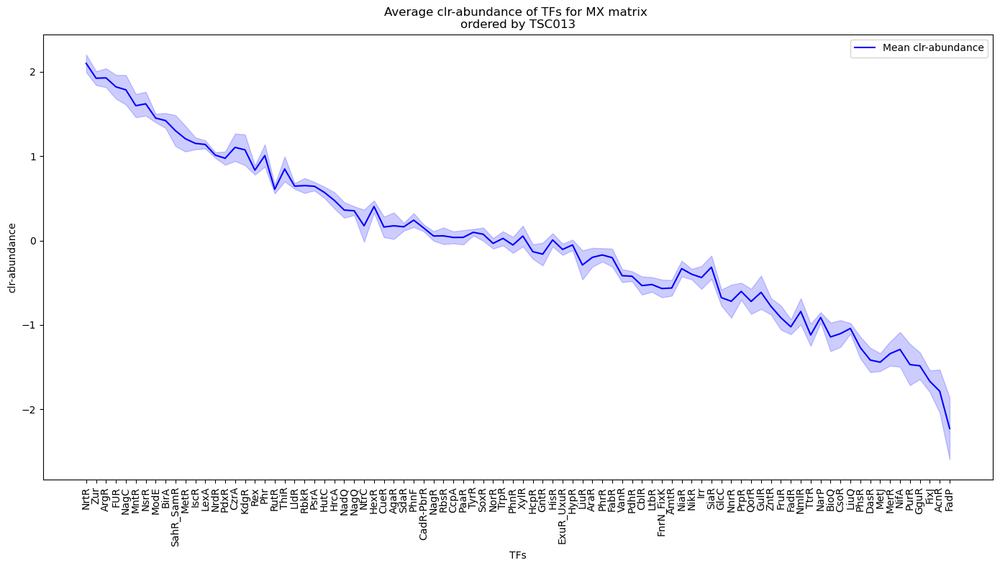

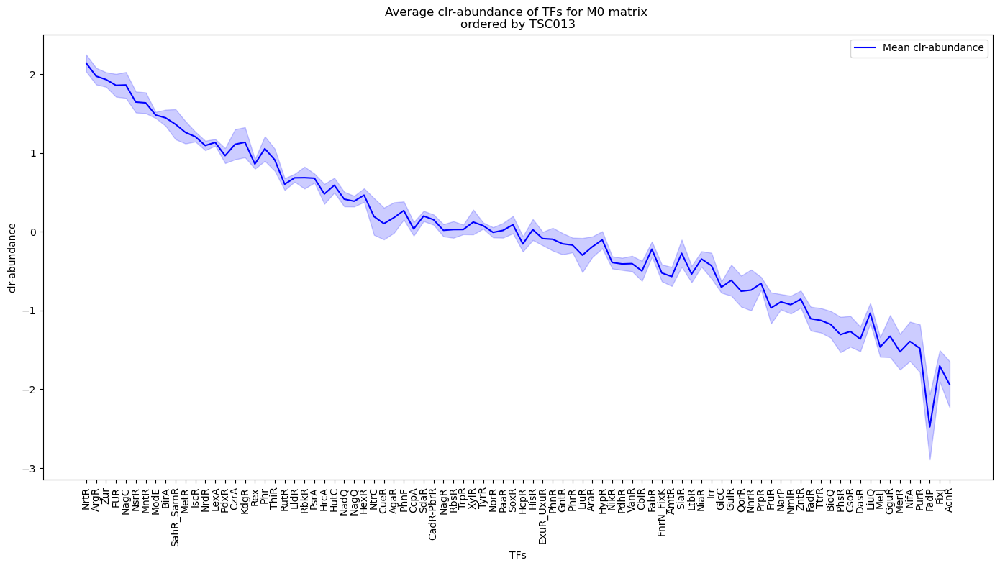

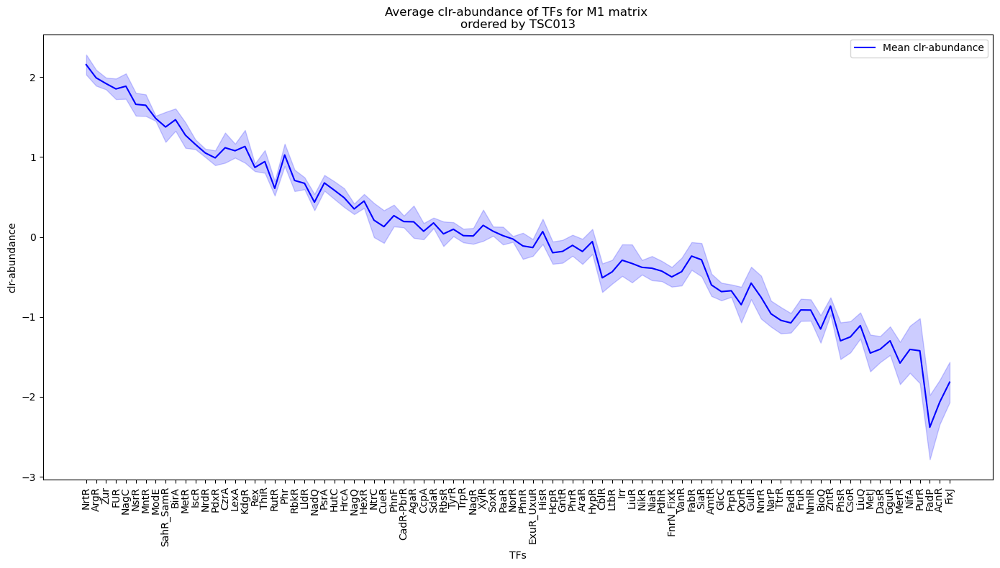

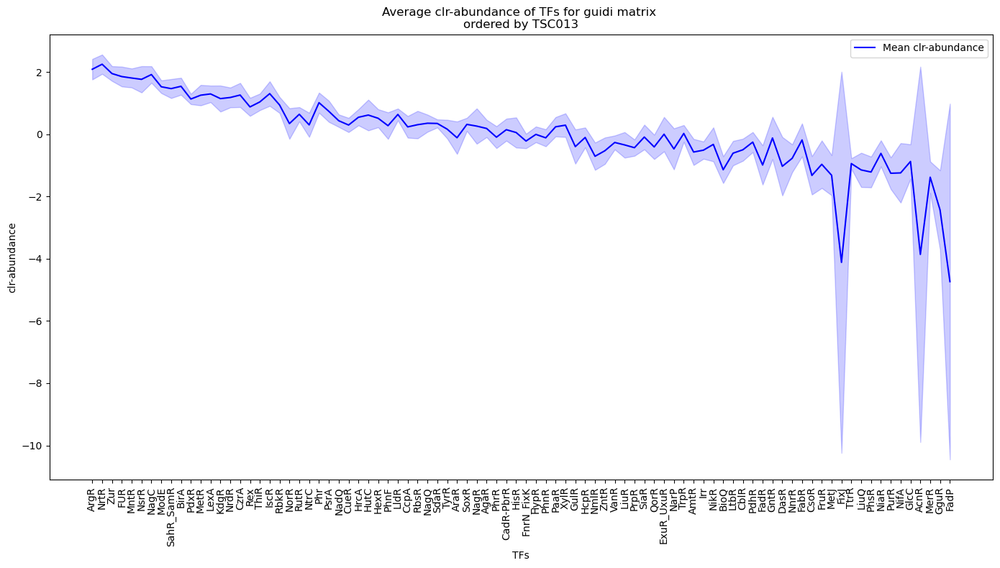

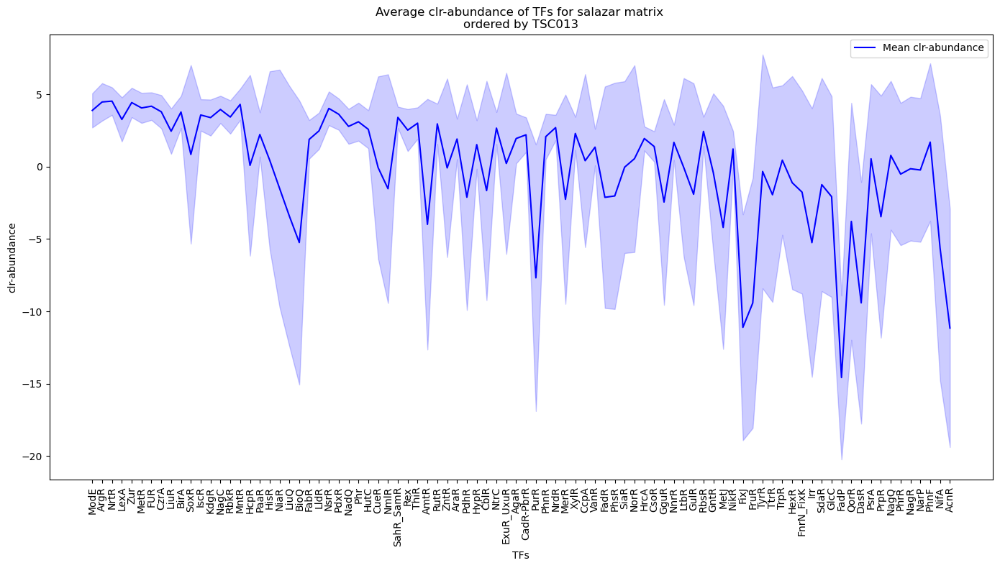

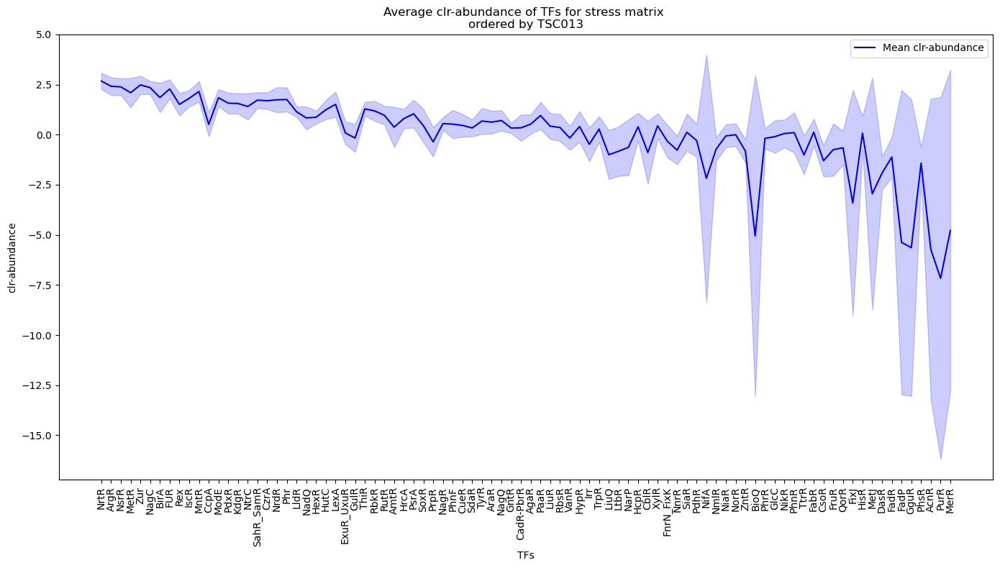

In [6]:
def plot_mean_matrix_abundance_selected(matrix_type, sample_name, selected_indices):
    
    matrix_file = f'matrices2/Matrix_{matrix_type}_srf.tsv'
    df = pd.read_csv(matrix_file, sep='\t', index_col=0)
    clr_df = clr_(df)  # centered-log-ratio normalization

    if sample_name not in clr_df.index:
        raise ValueError(f"The sample '{sample_name}' is not in the DataFrame.")

    clr_df_sorted = clr_df.loc[:, clr_df.loc[sample_name].sort_values(ascending=False).index]
    clr_df_transposed = clr_df_sorted.T

    clr_df_transposed_filtered = clr_df_transposed[selected_indices]

    mean_values = clr_df_transposed_filtered.mean(axis=1)
    std_values = clr_df_transposed_filtered.std(axis=1)

    plt.figure(figsize=(14, 8))
    plt.plot(clr_df_transposed_filtered.index, mean_values, color='blue', label='Mean clr-abundance')
    plt.fill_between(clr_df_transposed_filtered.index, mean_values - std_values, mean_values + std_values, color='b', alpha=0.2)

    plt.title(f'Average clr-abundance of TFs for {matrix_type} matrix \nordered by {sample_name}')
    plt.xlabel('TFs')
    plt.ylabel('clr-abundance')
    plt.xticks(rotation=90, ha='center')
    plt.legend()

    output_file = f'fingerprint_tara_10_selected_avg_{matrix_type}.pdf'
    plt.tight_layout()
    plt.savefig(output_file, bbox_inches='tight')
    plt.show()

matrix_types = ['MX', 'M0', 'M1', 'guidi', 'salazar', 'stress']
sample_name = 'TSC013'

selected_indices = ['TSC272', 'TSC065', 'TSC254', 'TSC013', 'TSC242', 'TSC216', 'TSC027', 'TSC135', 'TSC141', 'TSC167']

for matrix_type in matrix_types:
    plot_mean_matrix_abundance_selected(matrix_type, sample_name, selected_indices)


# Tara global surface and human gut 10 samples

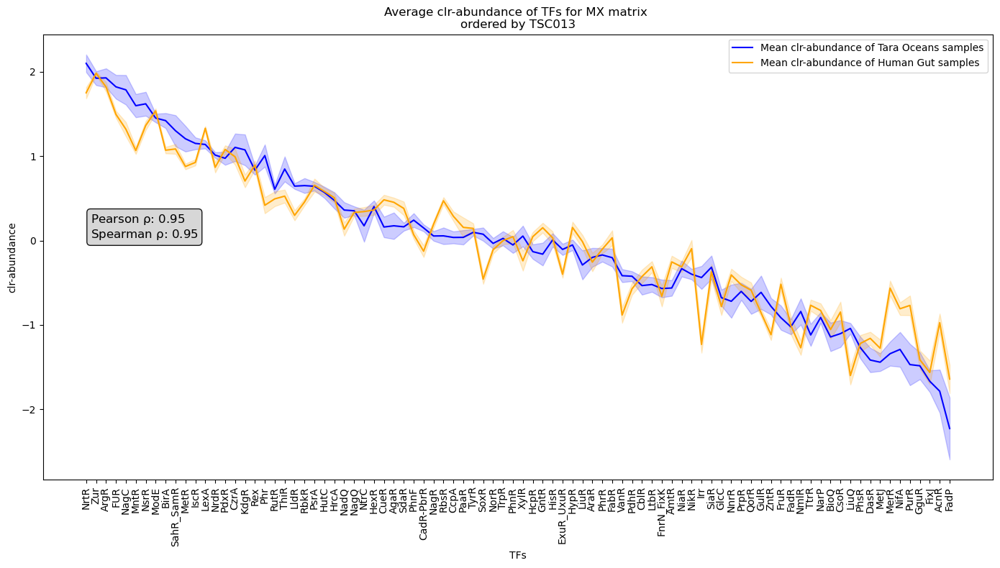

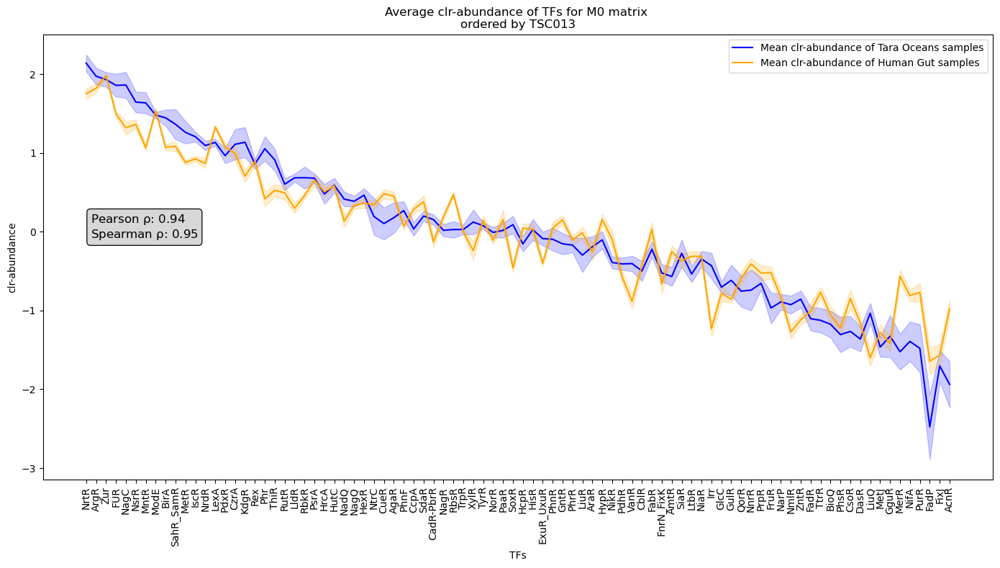

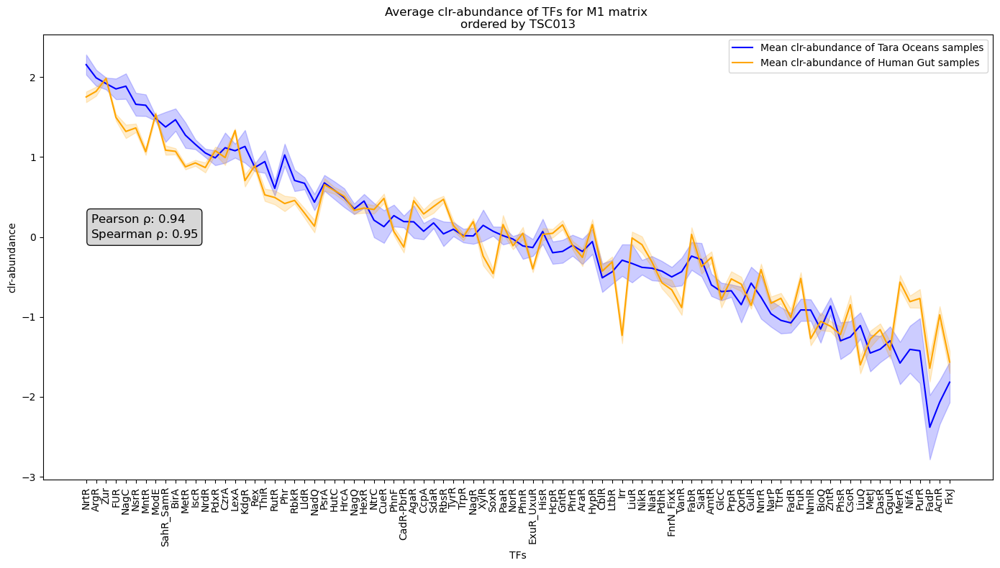

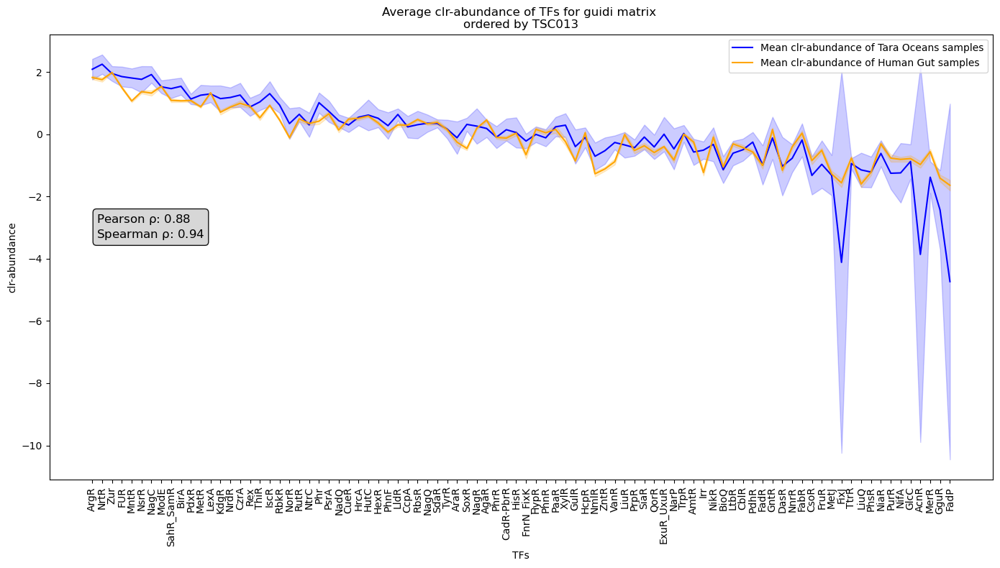

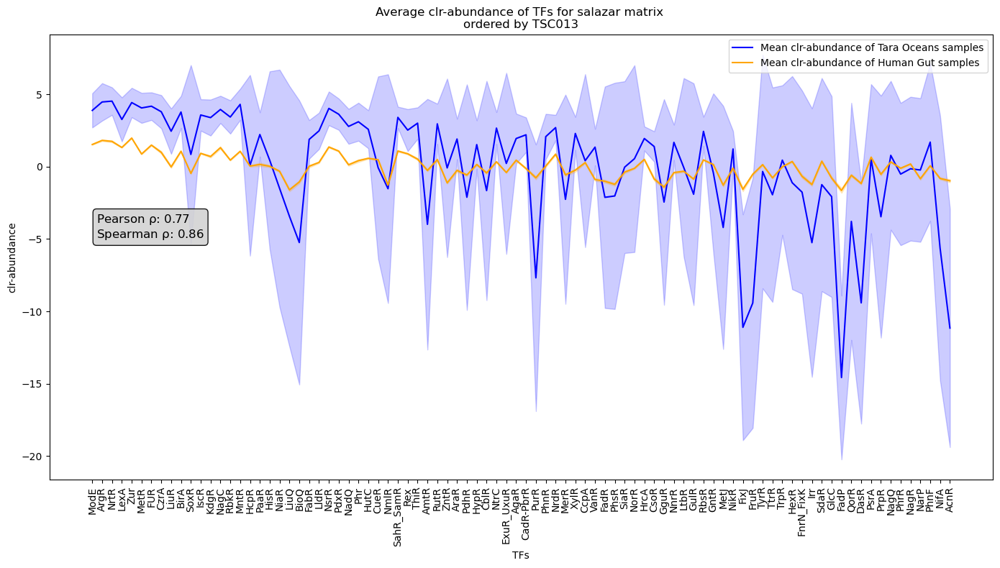

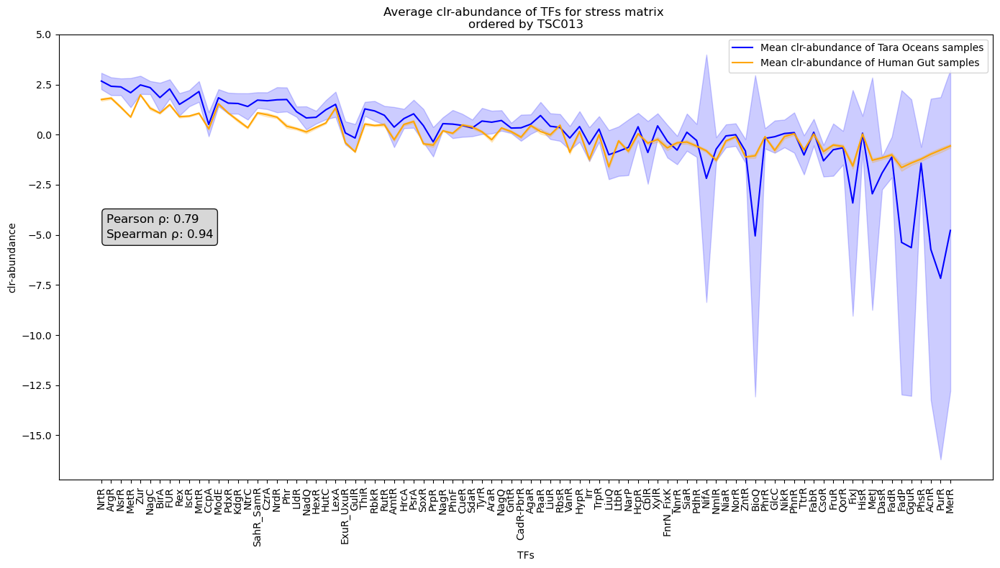

In [12]:
def plot_mean_matrix_abundance_comparison1(matrix_type, sample_name, selected_indices, df_fingerprint):
    matrix_file = f'matrices2/Matrix_{matrix_type}_srf.tsv'
    df = pd.read_csv(matrix_file, sep='\t', index_col=0)
    clr_df = clr_(df)  # centered-log-ratio normalization

    if sample_name not in clr_df.index:
        raise ValueError(f"The sample '{sample_name}' is not in the DataFrame.")

    clr_df_sorted = clr_df.loc[:, clr_df.loc[sample_name].sort_values(ascending=False).index]
    clr_df_transposed = clr_df_sorted.T
    clr_df_transposed_filtered = clr_df_transposed[selected_indices]

    mean_values = clr_df_transposed_filtered.mean(axis=1)
    std_values = clr_df_transposed_filtered.std(axis=1)

    gs_samples = df_fingerprint.loc[df_fingerprint.index.str.startswith('GS')]
    gs_samples_sorted = gs_samples[clr_df_sorted.columns]
    mean_gs_values = gs_samples_sorted.mean(axis=0)
    std_gs_values = gs_samples_sorted.std(axis=0)

    plt.figure(figsize=(14, 8))
    plt.plot(clr_df_transposed_filtered.index, mean_values, color='blue', label='Mean clr-abundance of Tara Oceans samples')
    plt.fill_between(clr_df_transposed_filtered.index, mean_values - std_values, mean_values + std_values,
                     color='blue', alpha=0.2)

    plt.plot(mean_gs_values.index, mean_gs_values, color='orange', label='Mean clr-abundance of Human Gut samples')
    plt.fill_between(mean_gs_values.index, mean_gs_values - std_gs_values, mean_gs_values + std_gs_values,
                     color='orange', alpha=0.2)

    # Calculate correlations
    pearson_rho, _ = pearsonr(mean_values, mean_gs_values)
    spearman_rho, _ = spearmanr(mean_values, mean_gs_values)

    # Annotate
    textstr = '\n'.join((
        f'$\\mathrm{{Pearson\\ \\rho}}$: {pearson_rho:.2f}',
        f'$\\mathrm{{Spearman\\ \\rho}}$: {spearman_rho:.2f}'
    ))

    props = dict(boxstyle='round', facecolor='lightgrey', alpha=0.9)
    plt.gca().text(0.05, 0.60, textstr, transform=plt.gca().transAxes, fontsize=12,
                   verticalalignment='top', bbox=props)

    plt.title(f'Average clr-abundance of TFs for {matrix_type} matrix \nordered by {sample_name}')
    plt.xlabel('TFs')
    plt.ylabel('clr-abundance')
    plt.xticks(rotation=90, ha='center')
    plt.legend()

    output_file = f'fingerprint_tara_10_comparison1_{matrix_type}.pdf'
    plt.tight_layout()
    plt.savefig(output_file, bbox_inches='tight')
    plt.show()

matrix_types = ['MX', 'M0', 'M1', 'guidi', 'salazar', 'stress']
sample_name = 'TSC013'

selected_indices = ['TSC272', 'TSC065', 'TSC254', 'TSC013', 'TSC242', 'TSC216', 'TSC027', 'TSC135', 'TSC141', 'TSC167']

df_fingerprint = pd.read_csv('matrices2/Matrix_outsource.tsv', sep='\t', index_col=0)

for matrix_type in matrix_types:
    plot_mean_matrix_abundance_comparison1(matrix_type, sample_name, selected_indices, df_fingerprint)


## Tara global surface and human gut 10 samples (linear regression)

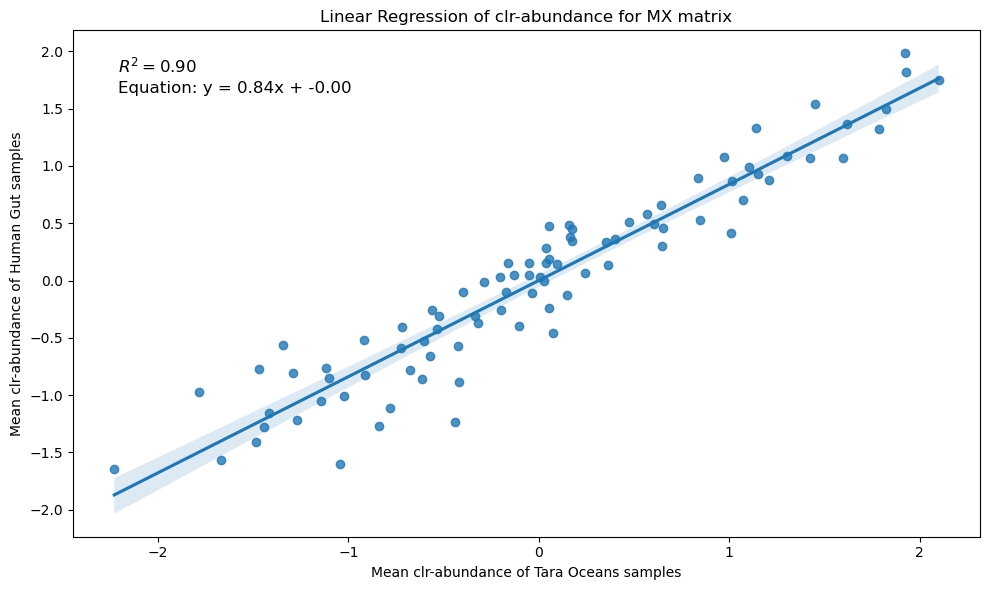

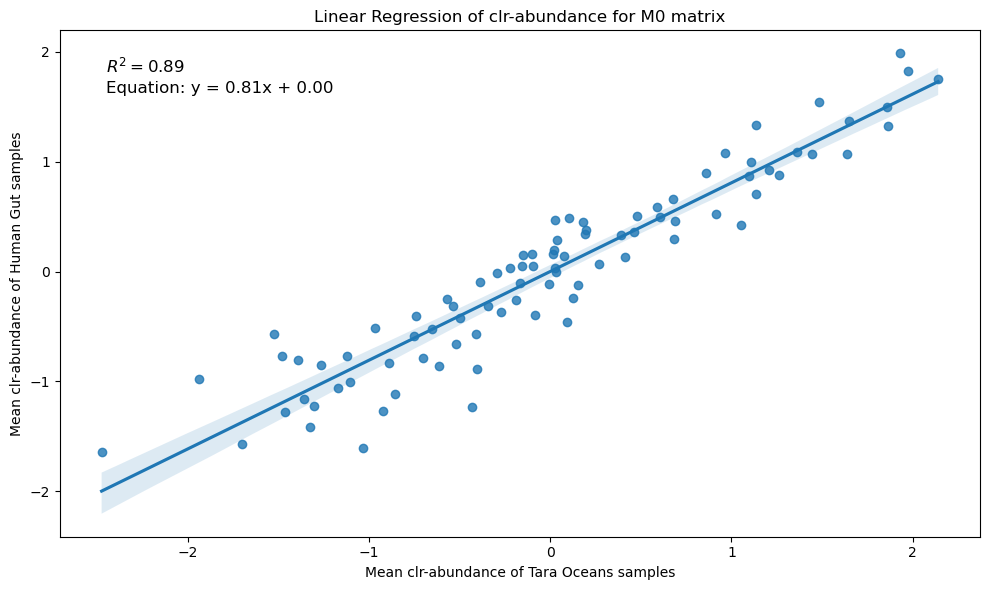

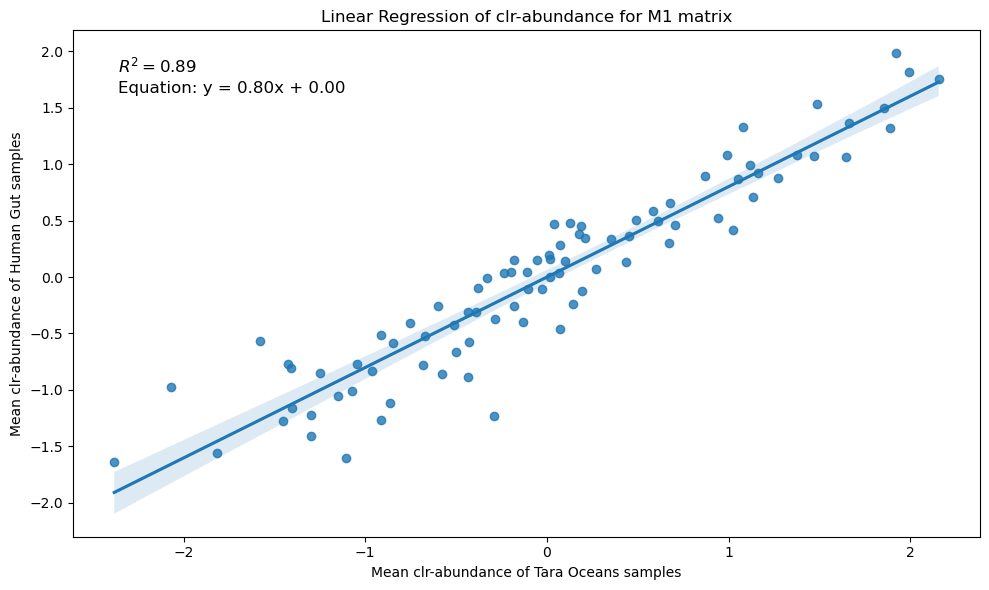

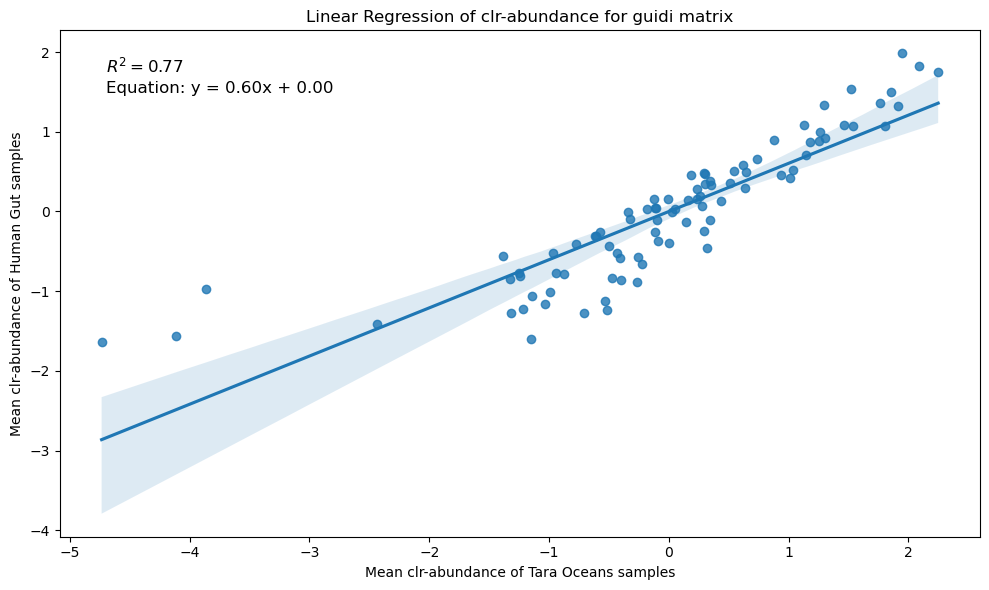

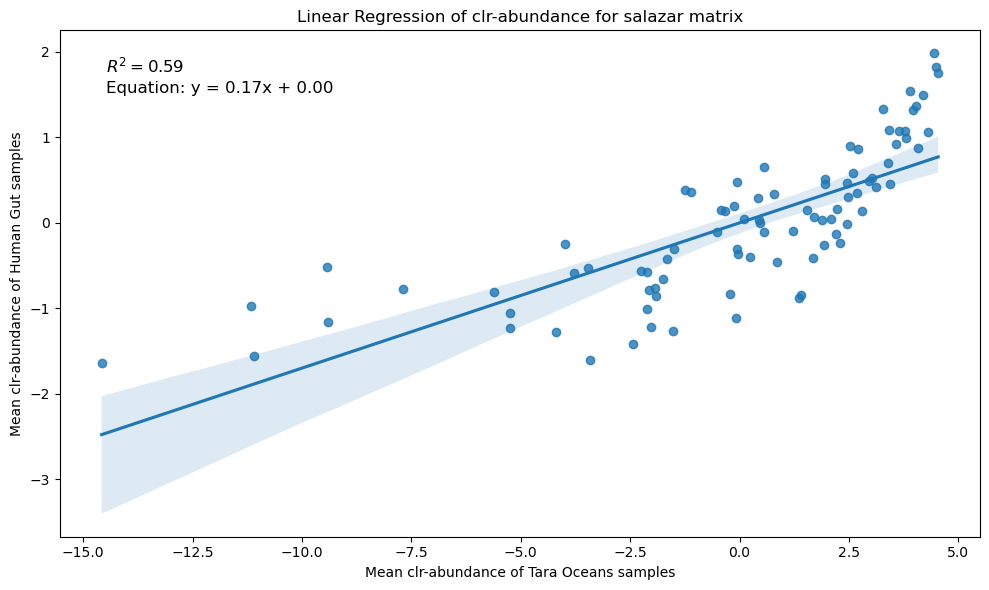

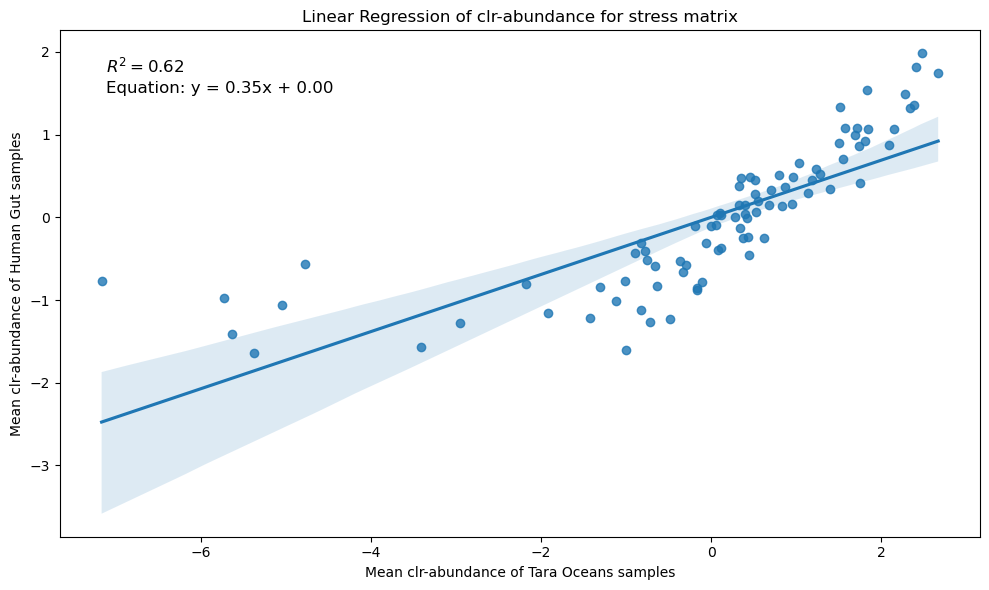

In [8]:
def plot_linear_regression(matrix_type, sample_name, selected_indices, df_fingerprint):
    matrix_file = f'matrices2/Matrix_{matrix_type}_srf.tsv'
    df = pd.read_csv(matrix_file, sep='\t', index_col=0)
    clr_df = clr_(df)  # centered-log-ratio normalization

    if sample_name not in clr_df.index:
        raise ValueError(f"The sample '{sample_name}' is not in the DataFrame.")

    tara_samples = clr_df.loc[selected_indices]
    mean_tara_values = tara_samples.mean(axis=0)
    
    gs_samples = df_fingerprint.loc[df_fingerprint.index.str.startswith('GS')]
    mean_gs_values = gs_samples.mean(axis=0)

    data = pd.DataFrame({
        'Mean Tara Oceans samples': mean_tara_values,
        'Mean Human Gut samples': mean_gs_values
    })

    # Calculate linear regression parameters
    slope, intercept, r_value, p_value, std_err = linregress(data['Mean Tara Oceans samples'], data['Mean Human Gut samples'])

    plt.figure(figsize=(10, 6))
    sns.regplot(x='Mean Tara Oceans samples', y='Mean Human Gut samples', data=data)
    
    plt.annotate(f'$R^2 = {r_value**2:.2f}$', xy=(0.05, 0.95), xycoords='axes fraction', fontsize=12, verticalalignment='top')
    plt.annotate(f'Equation: y = {slope:.2f}x + {intercept:.2f}', xy=(0.05, 0.90), xycoords='axes fraction', fontsize=12, verticalalignment='top')
    
    plt.title(f'Linear Regression of clr-abundance for {matrix_type} matrix')
    plt.xlabel('Mean clr-abundance of Tara Oceans samples')
    plt.ylabel('Mean clr-abundance of Human Gut samples')
    
    output_file = f'fingerprint_regplot_tara_gut_{matrix_type}.pdf'
    plt.tight_layout()
    plt.savefig(output_file)
    plt.show()

matrix_types = ['MX', 'M0', 'M1', 'guidi', 'salazar', 'stress']
sample_name = 'TSC013'

selected_indices = ['TSC272', 'TSC065', 'TSC254', 'TSC013', 'TSC242', 'TSC216', 'TSC027', 'TSC135', 'TSC141', 'TSC167']

df_fingerprint = pd.read_csv('matrices2/Matrix_outsource.tsv', sep='\t', index_col=0)

for matrix_type in matrix_types:
    plot_linear_regression(matrix_type, sample_name, selected_indices, df_fingerprint)


# Tara global surface, human gut and lake water 10 samples

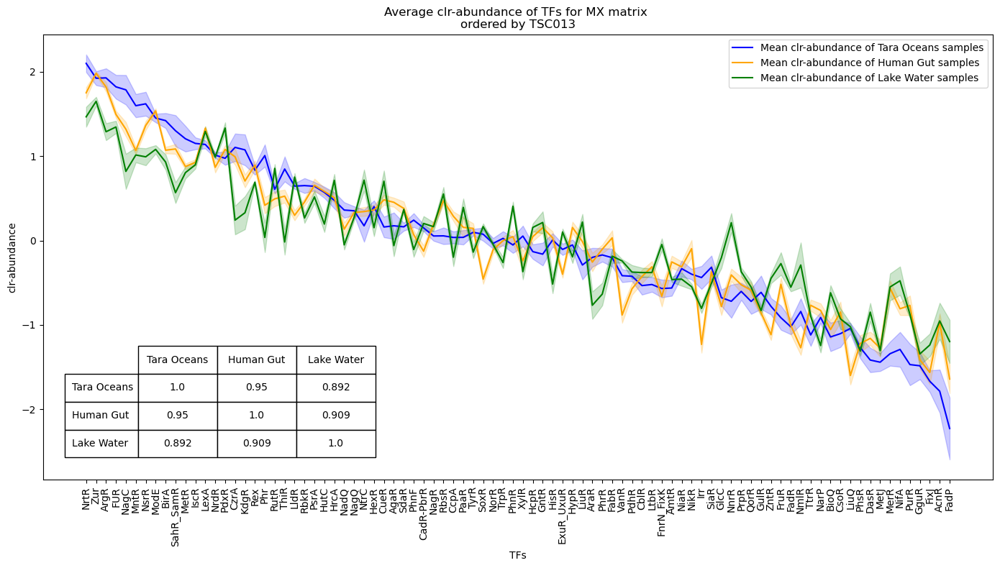

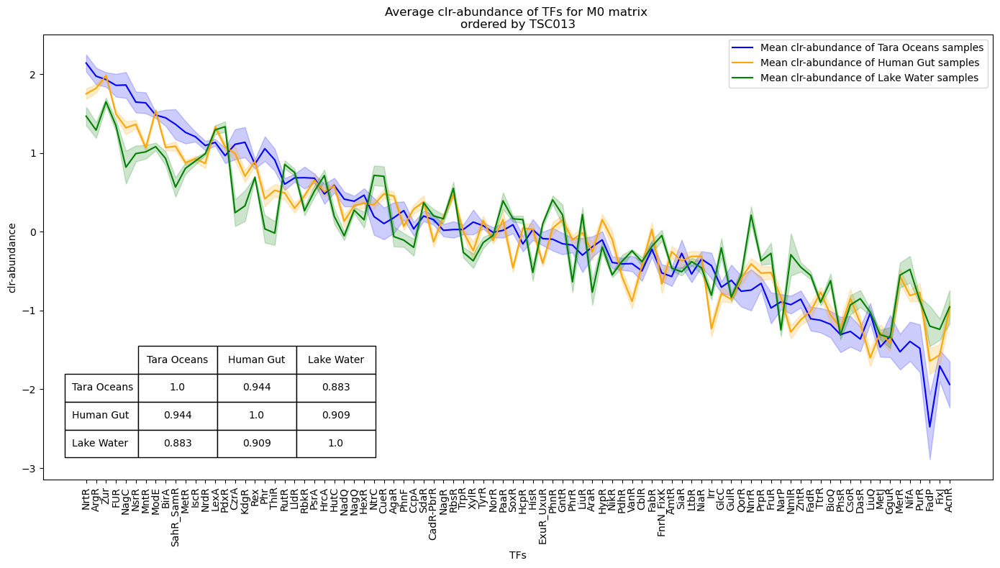

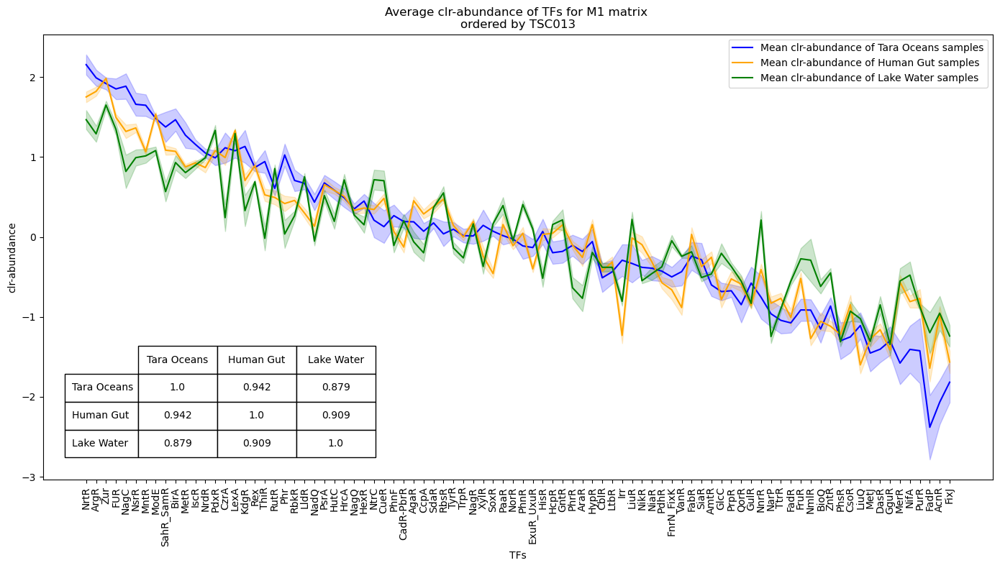

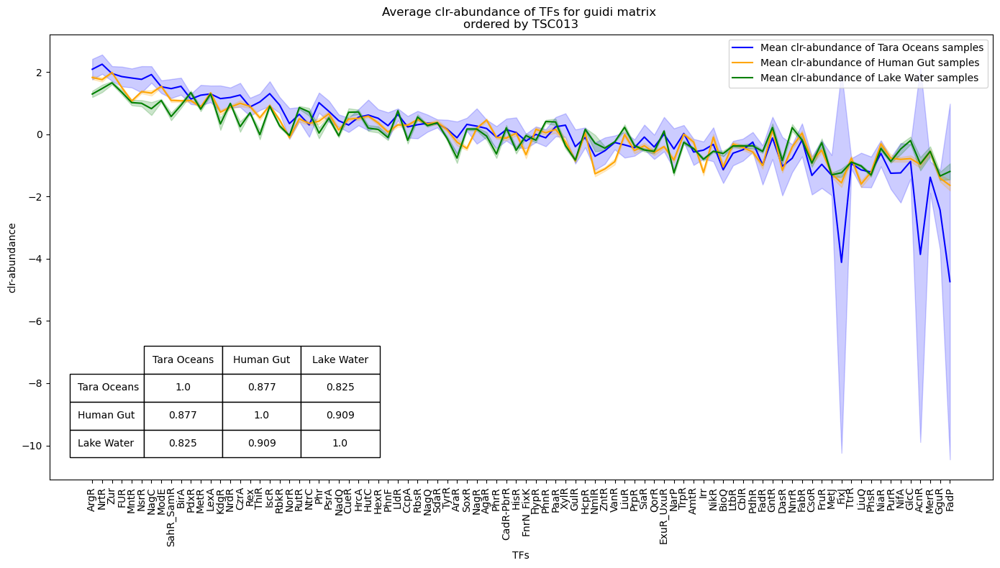

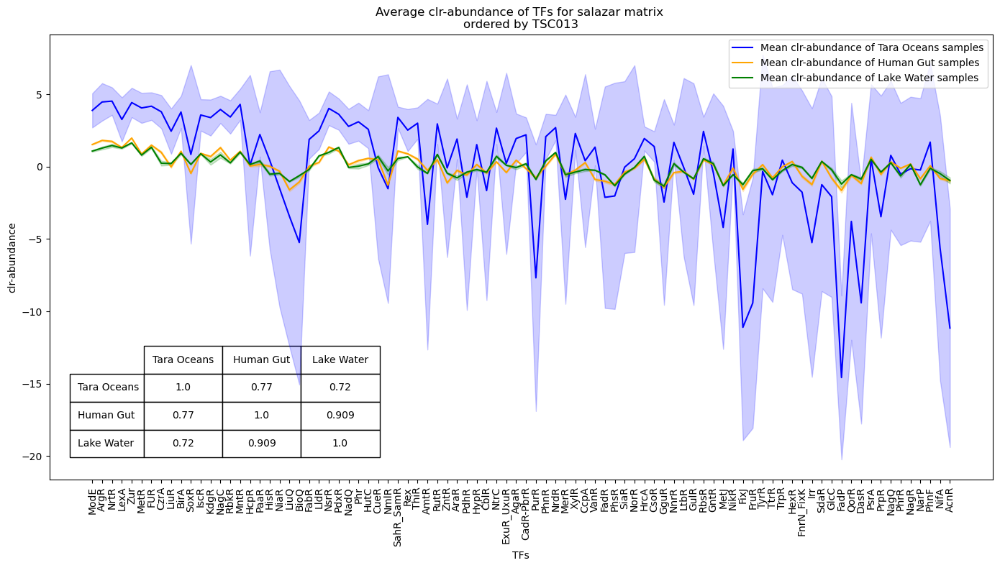

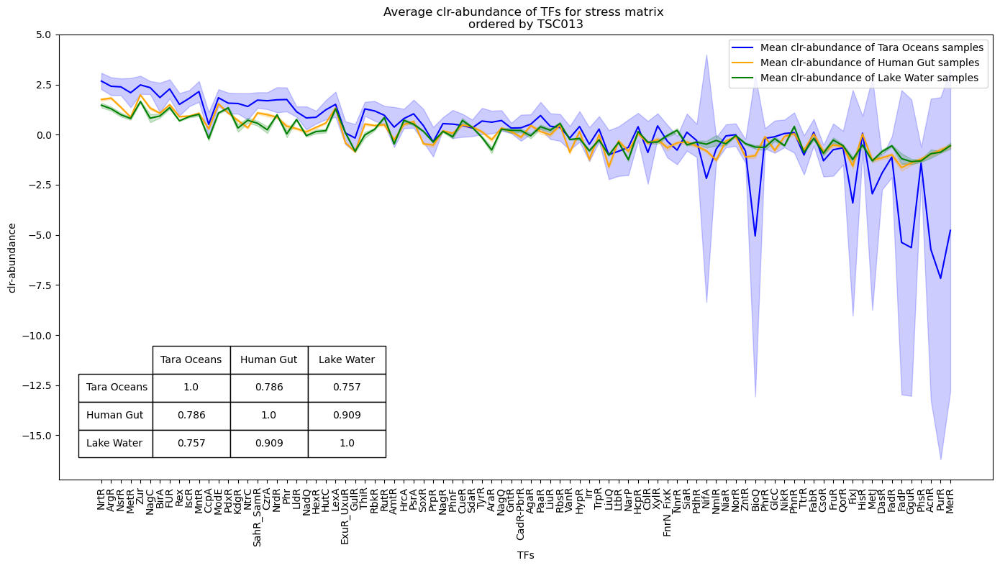

In [9]:
def plot_mean_matrix_abundance_comparison2(matrix_type, sample_name, selected_indices, df_fingerprint):
    matrix_file = f'matrices2/Matrix_{matrix_type}_srf.tsv'
    df = pd.read_csv(matrix_file, sep='\t', index_col=0)
    clr_df = clr_(df)  # centered-log-ratio normalization

    if sample_name not in clr_df.index:
        raise ValueError(f"The sample '{sample_name}' is not in the DataFrame.")

    clr_df_sorted = clr_df.loc[:, clr_df.loc[sample_name].sort_values(ascending=False).index]
    clr_df_transposed = clr_df_sorted.T
    clr_df_transposed_filtered = clr_df_transposed[selected_indices]

    mean_values = clr_df_transposed_filtered.mean(axis=1)
    std_values = clr_df_transposed_filtered.std(axis=1)

    gs_samples = df_fingerprint.loc[df_fingerprint.index.str.startswith('GS')]
    gs_samples_sorted = gs_samples[clr_df_sorted.columns]
    mean_gs_values = gs_samples_sorted.mean(axis=0)
    std_gs_values = gs_samples_sorted.std(axis=0)

    ws_samples = df_fingerprint.loc[df_fingerprint.index.str.startswith('WS')]
    ws_samples_sorted = ws_samples[clr_df_sorted.columns]
    mean_ws_values = ws_samples_sorted.mean(axis=0)
    std_ws_values = ws_samples_sorted.std(axis=0)

    plt.figure(figsize=(14, 8))
    plt.plot(clr_df_transposed_filtered.index, mean_values, color='blue', label='Mean clr-abundance of Tara Oceans samples')
    plt.fill_between(clr_df_transposed_filtered.index, mean_values - std_values, mean_values + std_values,
                     color='blue', alpha=0.2)

    plt.plot(mean_gs_values.index, mean_gs_values, color='orange', label='Mean clr-abundance of Human Gut samples')
    plt.fill_between(mean_gs_values.index, mean_gs_values - std_gs_values, mean_gs_values + std_gs_values,
                     color='orange', alpha=0.2)

    plt.plot(mean_ws_values.index, mean_ws_values, color='green', label='Mean clr-abundance of Lake Water samples')
    plt.fill_between(mean_ws_values.index, mean_ws_values - std_ws_values, mean_ws_values + std_ws_values,
                     color='green', alpha=0.2)

    plt.title(f'Average clr-abundance of TFs for {matrix_type} matrix \nordered by {sample_name}')
    plt.xlabel('TFs')
    plt.ylabel('clr-abundance')
    plt.xticks(rotation=90, ha='center')
    plt.legend()

    # Calculate correlations
    corr_matrix = np.corrcoef([mean_values, mean_gs_values, mean_ws_values])
    corr_df = pd.DataFrame(corr_matrix, index=['Tara Oceans', 'Human Gut', 'Lake Water'], columns=['Tara Oceans', 'Human Gut', 'Lake Water'])

    the_table = plt.table(cellText=corr_df.values.round(3),
                          rowLabels=corr_df.index,
                          colLabels=corr_df.columns,
                          cellLoc='center',
                          loc='upper right',
                          bbox=[0.1, 0.05, 0.25, 0.25])  # Adjust table

    # Ajustar el tamaño del texto en la tabla
    the_table.auto_set_font_size(False)
    the_table.set_fontsize(10)

    output_file = f'fingerprint_tara_10_comparison2_{matrix_type}.pdf'
    plt.tight_layout()
    plt.savefig(output_file, bbox_inches='tight')
    plt.show()

matrix_types = ['MX', 'M0', 'M1', 'guidi', 'salazar', 'stress']
sample_name = 'TSC013'

selected_indices = ['TSC272', 'TSC065', 'TSC254', 'TSC013', 'TSC242', 'TSC216', 'TSC027', 'TSC135', 'TSC141', 'TSC167']

df_fingerprint = pd.read_csv('matrices2/Matrix_outsource.tsv', sep='\t', index_col=0)

for matrix_type in matrix_types:
    plot_mean_matrix_abundance_comparison2(matrix_type, sample_name, selected_indices, df_fingerprint)


# Tara global surface, human gut, farmland soil and water lake 10 samples

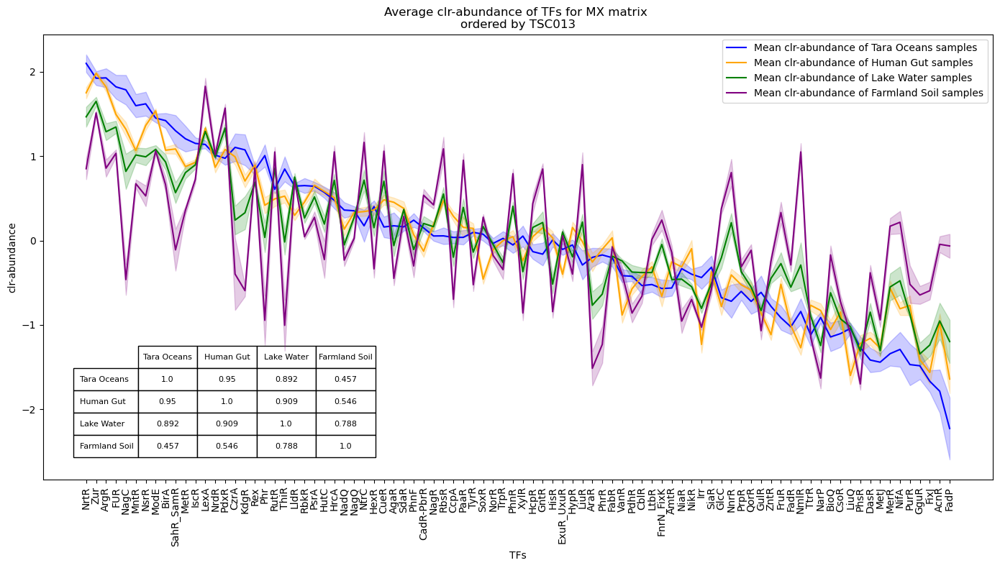

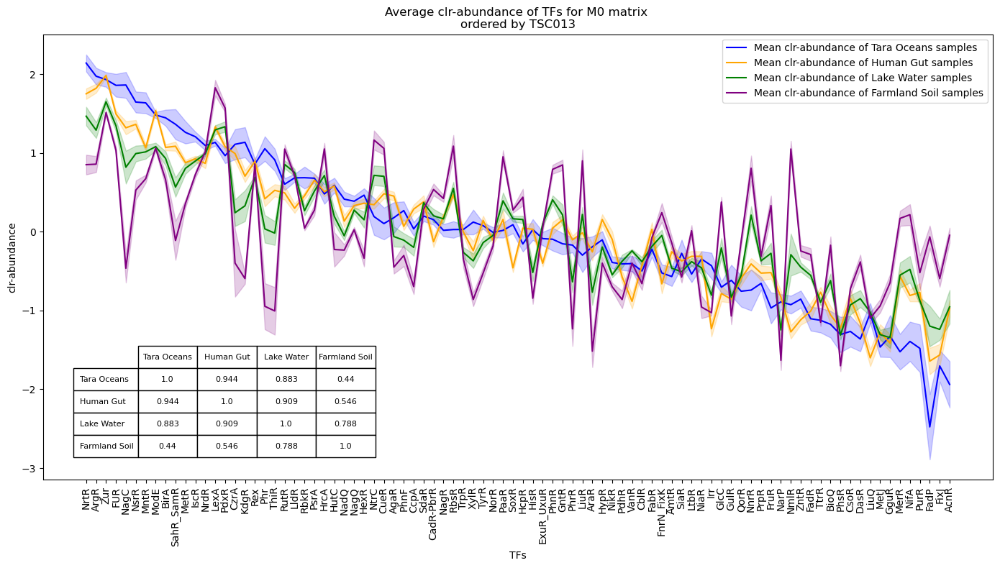

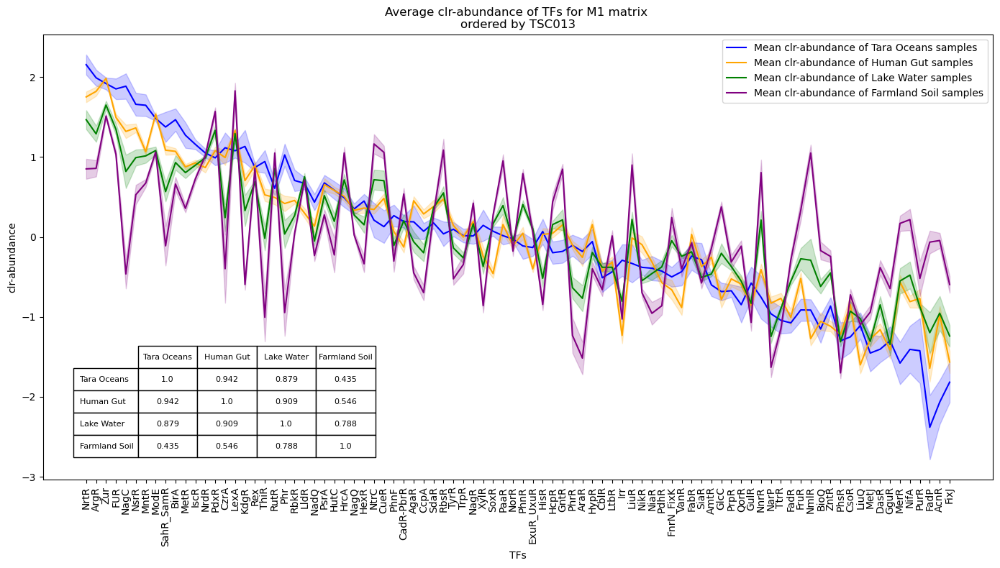

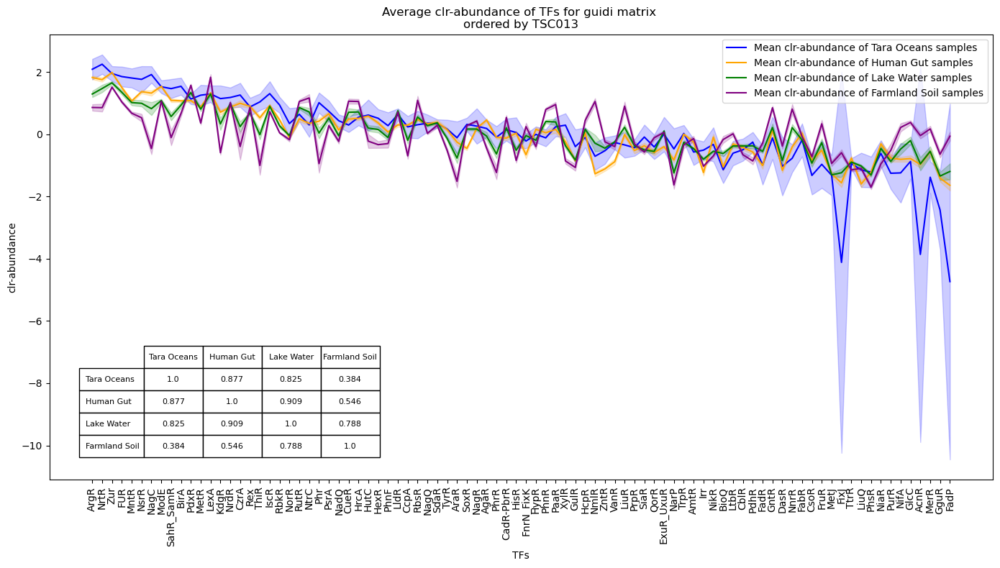

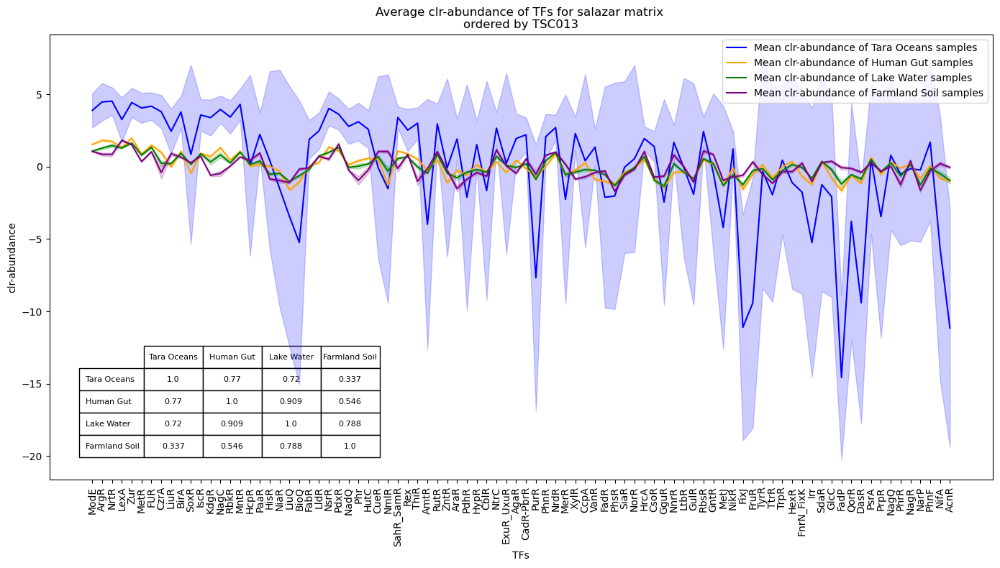

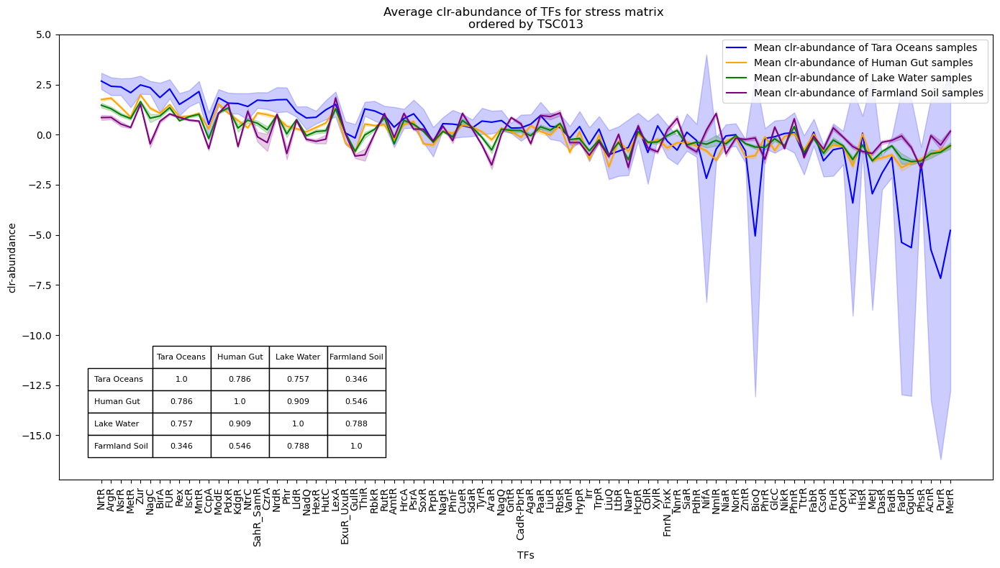

In [10]:
def plot_mean_matrix_abundance_comparison3(matrix_type, sample_name, selected_indices, df_fingerprint):
    matrix_file = f'matrices2/Matrix_{matrix_type}_srf.tsv'
    df = pd.read_csv(matrix_file, sep='\t', index_col=0)
    clr_df = clr_(df)  # centered-log-ratio normalization

    if sample_name not in clr_df.index:
        raise ValueError(f"The sample '{sample_name}' is not in the DataFrame.")

    clr_df_sorted = clr_df.loc[:, clr_df.loc[sample_name].sort_values(ascending=False).index]
    clr_df_transposed = clr_df_sorted.T
    clr_df_transposed_filtered = clr_df_transposed[selected_indices]

    mean_values = clr_df_transposed_filtered.mean(axis=1)
    std_values = clr_df_transposed_filtered.std(axis=1)

    gs_samples = df_fingerprint.loc[df_fingerprint.index.str.startswith('GS')]
    gs_samples_sorted = gs_samples[clr_df_sorted.columns]
    mean_gs_values = gs_samples_sorted.mean(axis=0)
    std_gs_values = gs_samples_sorted.std(axis=0)

    ss_samples = df_fingerprint.loc[df_fingerprint.index.str.startswith('SS')]
    ss_samples_sorted = ss_samples[clr_df_sorted.columns]
    mean_ss_values = ss_samples_sorted.mean(axis=0)
    std_ss_values = ss_samples_sorted.std(axis=0)

    ws_samples = df_fingerprint.loc[df_fingerprint.index.str.startswith('WS')]
    ws_samples_sorted = ws_samples[clr_df_sorted.columns]
    mean_ws_values = ws_samples_sorted.mean(axis=0)
    std_ws_values = ws_samples_sorted.std(axis=0)

    plt.figure(figsize=(14, 8))
    plt.plot(clr_df_transposed_filtered.index, mean_values, color='blue', label='Mean clr-abundance of Tara Oceans samples')
    plt.fill_between(clr_df_transposed_filtered.index, mean_values - std_values, mean_values + std_values,
                     color='blue', alpha=0.2)

    plt.plot(mean_gs_values.index, mean_gs_values, color='orange', label='Mean clr-abundance of Human Gut samples')
    plt.fill_between(mean_gs_values.index, mean_gs_values - std_gs_values, mean_gs_values + std_gs_values,
                     color='orange', alpha=0.2)

    plt.plot(mean_ws_values.index, mean_ws_values, color='green', label='Mean clr-abundance of Lake Water samples')
    plt.fill_between(mean_ws_values.index, mean_ws_values - std_ws_values, mean_ws_values + std_ws_values,
                     color='green', alpha=0.2)

    plt.plot(mean_ss_values.index, mean_ss_values, color='purple', label='Mean clr-abundance of Farmland Soil samples')
    plt.fill_between(mean_ss_values.index, mean_ss_values - std_ss_values, mean_ss_values + std_ss_values,
                     color='purple', alpha=0.2)

    plt.title(f'Average clr-abundance of TFs for {matrix_type} matrix \nordered by {sample_name}')
    plt.xlabel('TFs')
    plt.ylabel('clr-abundance')
    plt.xticks(rotation=90, ha='center')
    plt.legend()

    # Calcular las correlaciones entre las variables
    corr_matrix = np.corrcoef([mean_values, mean_gs_values, mean_ws_values, mean_ss_values])
    corr_df = pd.DataFrame(corr_matrix, index=['Tara Oceans', 'Human Gut', 'Lake Water', 'Farmland Soil'], columns=['Tara Oceans', 'Human Gut', 'Lake Water', 'Farmland Soil'])

    # Añadir una tabla de correlación en la figura
    the_table = plt.table(cellText=corr_df.values.round(3),
                          rowLabels=corr_df.index,
                          colLabels=corr_df.columns,
                          cellLoc='center',
                          loc='upper right',
                          bbox=[0.1, 0.05, 0.25, 0.25])  # Ajustar el tamaño y la posición de la tabla

    # Ajustar el tamaño del texto en la tabla
    the_table.auto_set_font_size(False)
    the_table.set_fontsize(8)

    output_file = f'fingerprint_tara_10_comparison3_{matrix_type}.pdf'
    plt.tight_layout()
    plt.savefig(output_file, bbox_inches='tight')
    plt.show()

matrix_types = ['MX', 'M0', 'M1', 'guidi', 'salazar', 'stress']
sample_name = 'TSC013'

selected_indices = ['TSC272', 'TSC065', 'TSC254', 'TSC013', 'TSC242', 'TSC216', 'TSC027', 'TSC135', 'TSC141', 'TSC167']

df_fingerprint = pd.read_csv('matrices2/Matrix_outsource.tsv', sep='\t', index_col=0)

for matrix_type in matrix_types:
    plot_mean_matrix_abundance_comparison3(matrix_type, sample_name, selected_indices, df_fingerprint)


# FabR vs Temperature

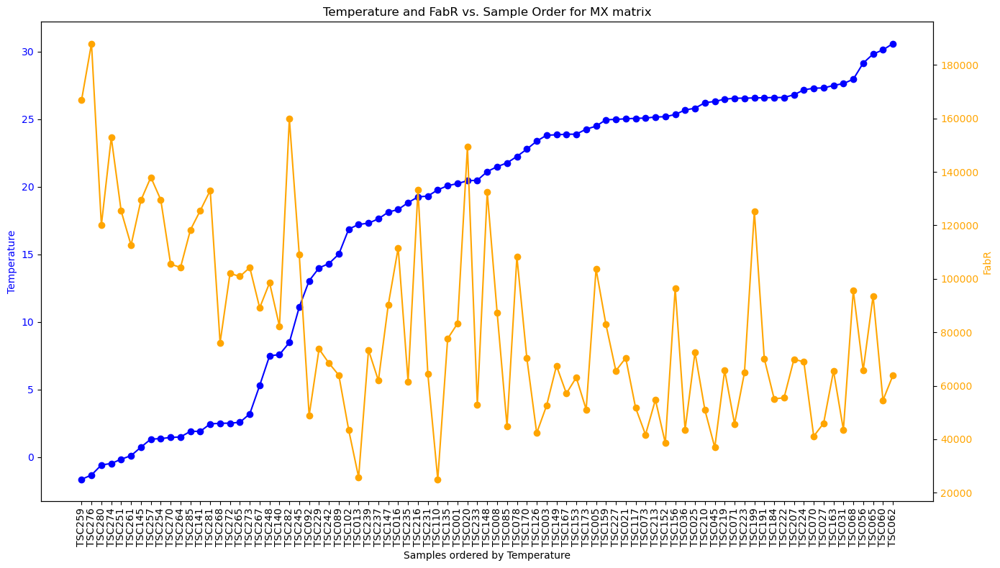

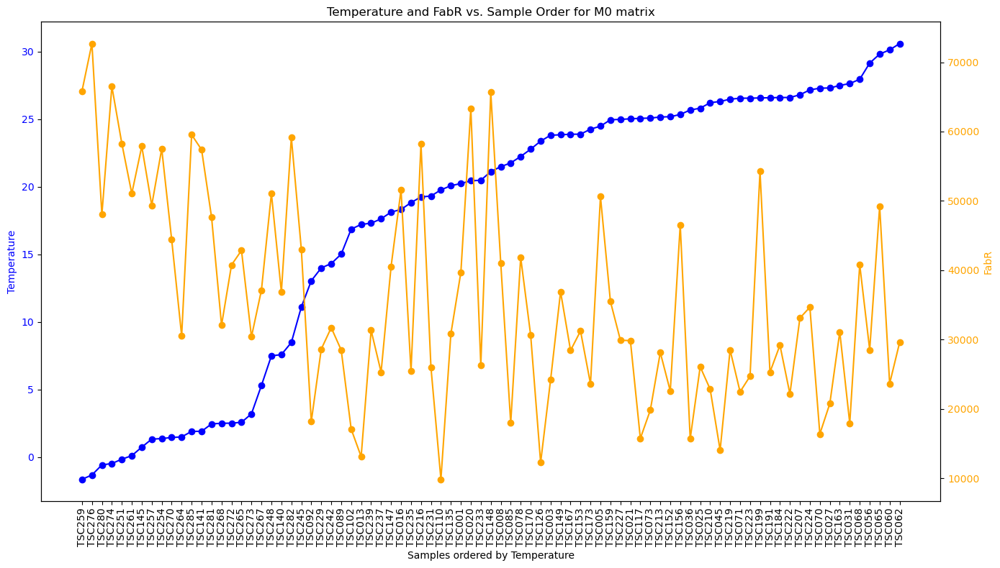

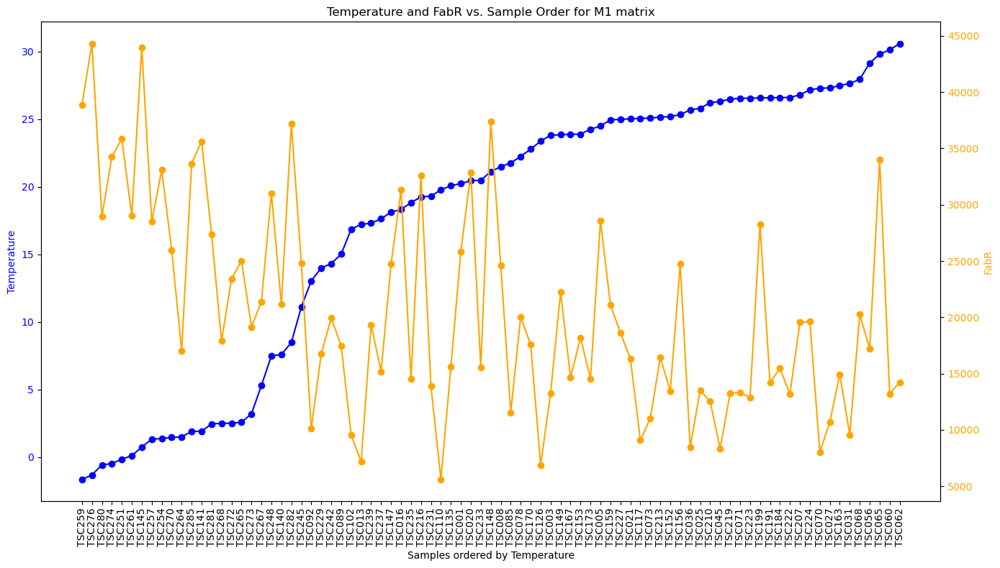

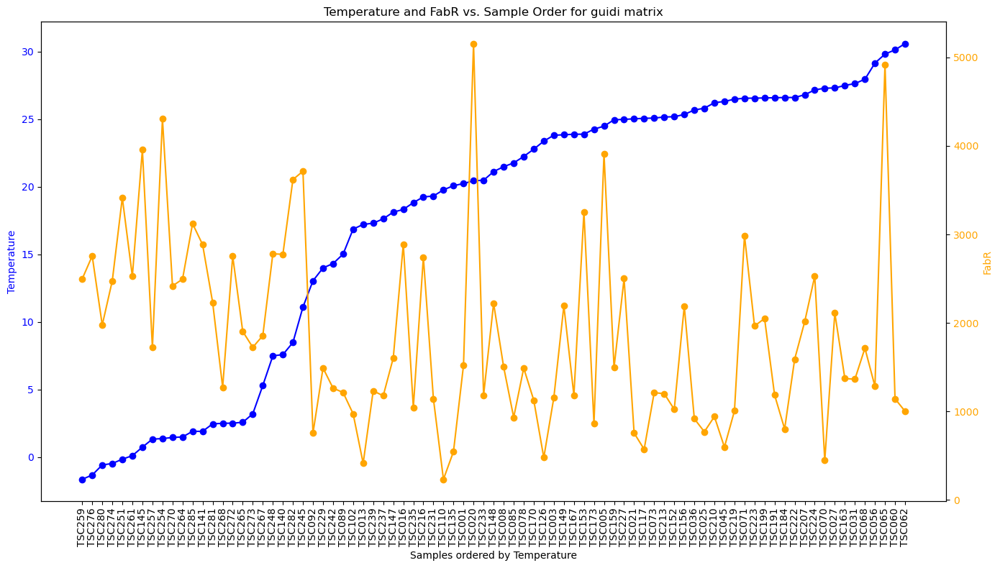

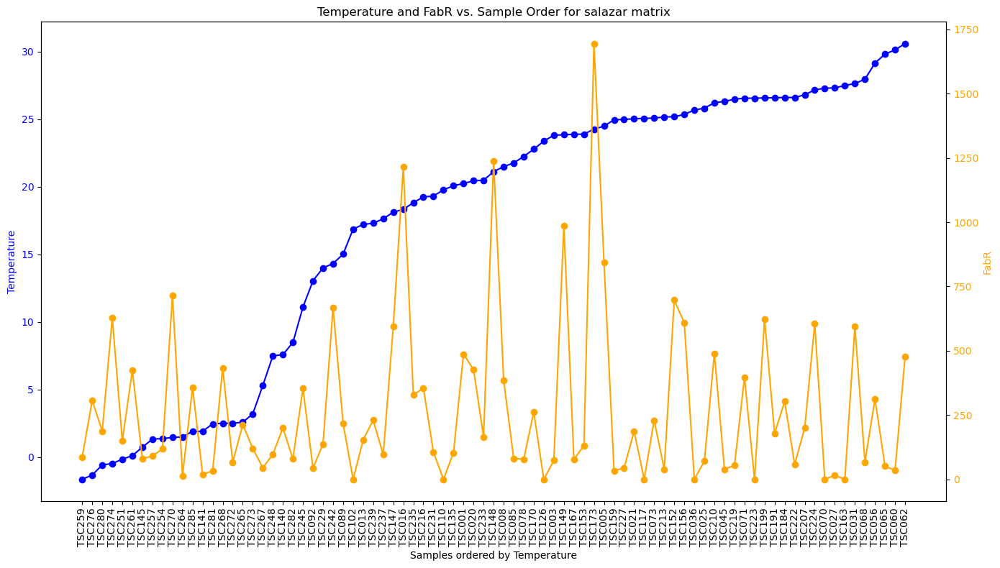

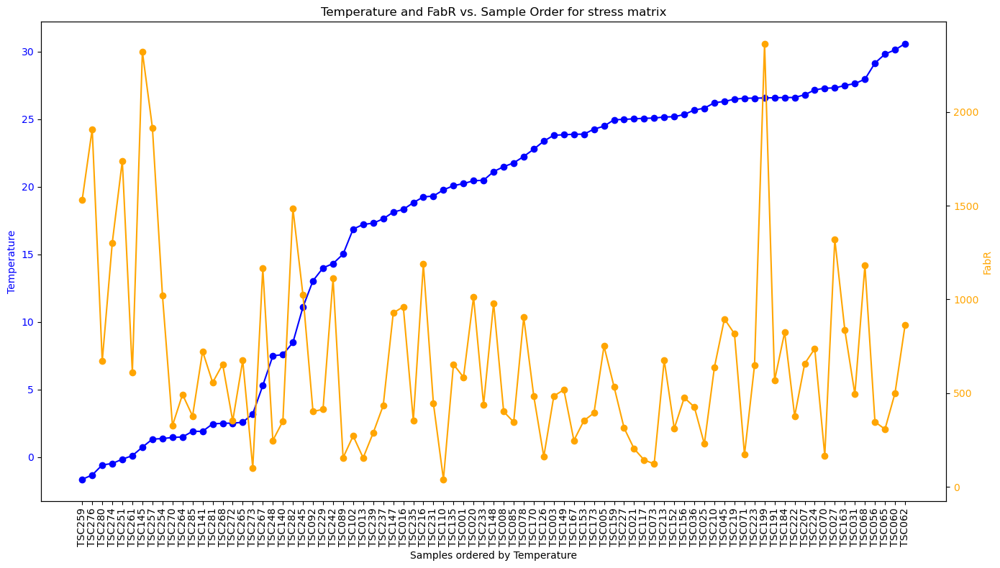

In [11]:
def plot_env_bio(matrix_type, df_md, env_var, bio_var):
    matrix_file = f'matrices2/Matrix_{matrix_type}_srf.tsv'
    df = pd.read_csv(matrix_file, sep='\t', index_col=0)
    
    if bio_var not in df.columns:
        raise ValueError(f"The column '{bio_var}' is not found in the {matrix_type} matrix.")
    
    df_md_aligned = df_md.loc[df.index]
    
    if env_var not in df_md_aligned.columns:
        raise ValueError(f"The column '{env_var}' is not found in the `md` DataFrame.")
    
    bio_values = df[bio_var]
    env_values = df_md_aligned[env_var]
    
    combined_df = pd.DataFrame({
        f'{bio_var}': bio_values,
        f'{env_var}': env_values
    }).dropna()
    
    combined_df_sorted = combined_df.sort_values(by=env_var)
    
    fig, ax1 = plt.subplots(figsize=(14, 8))
    
    ax1.plot(combined_df_sorted.index, combined_df_sorted[env_var], marker='o', linestyle='-', label=env_var, color='blue')
    ax1.set_xlabel(f'Samples ordered by {env_var}')
    ax1.set_ylabel(env_var, color='blue')
    ax1.tick_params(axis='y', labelcolor='blue')
    
    ax1.set_xticks(range(len(combined_df_sorted.index)))
    ax1.set_xticklabels(combined_df_sorted.index, rotation=90, ha='center')
    
    ax2 = ax1.twinx()
    ax2.plot(combined_df_sorted.index, combined_df_sorted[bio_var], marker='o', linestyle='-', label=bio_var, color='orange')
    ax2.set_ylabel(bio_var, color='orange')
    ax2.tick_params(axis='y', labelcolor='orange')
    
    plt.title(f'{env_var} and {bio_var} vs. Sample Order for {matrix_type} matrix')
    fig.tight_layout()
    
    output_file = f'fingerprint_{bio_var}_{env_var}_{matrix_type}.pdf'
    plt.savefig(output_file, bbox_inches='tight')
    plt.show()

matrix_types = ['MX', 'M0', 'M1', 'guidi', 'salazar', 'stress']

md = pd.read_csv('metadata.tsv', sep='\t', index_col=0)

for matrix_type in matrix_types:
    plot_env_bio(matrix_type, md, 'Temperature', 'FabR')